## <span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#B43104;"> Credit Card Users Churn Prediction
 
###### <span style="font-family: Arial;font-size:1.75em;color:#6E6E6E;">Pablo Salvador Lopez

<br>

##### <span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#6E6E6E;">Contents:

</br>

[GOAL DEFINITON](#goal)

[EDA](#eda)

[EDA Insights](#EDAInsights)

[Pre-Processing](#PrePo)

[Algorithm Development,Testing and Insights](#ML)

[Model performance evaluation](#Evaluation)

[Actionable Insights & Recommendations](#Insight)

<a id='the_destination'></a>

#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Libraries

In [40]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# To enable plotting graphs in Jupyter notebook
%matplotlib inline
import seaborn as sns
import math
from collections import Counter
import scipy.stats as ss
from scipy.stats import zscore
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
### Style 
pd.options.display.float_format = '{:,.2f}'.format    ## important decimals    
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
sns.set_style(style='darkgrid')

<a id='goal'></a>
#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Goal Definition

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged on every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers’ and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help bank improve their services so that customers do not renounce their credit cards

#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Objective

Objective

+ Explore and visualize the dataset.
- Build a classification model to predict if the customer is going to churn or not
+ Optimize the model using appropriate techniques
- Generate a set of insights and recommendations that will help the bank

<a id='EDA'></a>

#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  EDA

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#C43104;">  Initial Exploration 

In [41]:
#load the data
df = pd.read_csv("./BankChurners.csv",na_values = ["n.a.","?","NA","n/a", "na", "--","nan"]) 

In [3]:
print('------------------------DataSet Shape-------------------------------------')
print(df.shape)
print('------------------------DataSet Info--------------------------------------')
print(df.info())
print('------------------------DataSet Stats-------------------------------------')
print(df.describe().T)
print('------------------------Missing Values------------------------------------')
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
print(missing_value_df[['column_name','percent_missing']])

------------------------DataSet Shape-------------------------------------
(10127, 21)
------------------------DataSet Info--------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
CLIENTNUM                   10127 non-null int64
Attrition_Flag              10127 non-null object
Customer_Age                10127 non-null int64
Gender                      10127 non-null object
Dependent_count             10127 non-null int64
Education_Level             10127 non-null object
Marital_Status              10127 non-null object
Income_Category             10127 non-null object
Card_Category               10127 non-null object
Months_on_book              10127 non-null int64
Total_Relationship_Count    10127 non-null int64
Months_Inactive_12_mon      10127 non-null int64
Contacts_Count_12_mon       10127 non-null int64
Credit_Limit                10127 non-null float64
Total_Revolving_Bal         10127 n

In [6]:
## Check for missing values 
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
CLIENTNUM,CLIENTNUM,0.00
Attrition_Flag,Attrition_Flag,0.00
Customer_Age,Customer_Age,0.00
Gender,Gender,0.00
Dependent_count,Dependent_count,0.00
Education_Level,Education_Level,0.00
Marital_Status,Marital_Status,0.00
Income_Category,Income_Category,0.00
Card_Category,Card_Category,0.00
Months_on_book,Months_on_book,0.00


<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#C43104;">  Study Unique Values 

In [11]:
#df2 = df.drop(columns=["TypeofContact"])
for feature in df.columns:
    uniq = np.unique(df[feature])
    print('{}: {} distinct values -  {}'.format(feature,len(uniq),uniq))

CLIENTNUM: 10127 distinct values -  [708082083 708083283 708084558 ... 828294933 828298908 828343083]
Attrition_Flag: 2 distinct values -  ['Attrited Customer' 'Existing Customer']
Customer_Age: 45 distinct values -  [26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 70 73]
Gender: 2 distinct values -  ['F' 'M']
Dependent_count: 6 distinct values -  [0 1 2 3 4 5]
Education_Level: 7 distinct values -  ['College' 'Doctorate' 'Graduate' 'High School' 'Post-Graduate'
 'Uneducated' 'Unknown']
Marital_Status: 4 distinct values -  ['Divorced' 'Married' 'Single' 'Unknown']
Income_Category: 6 distinct values -  ['$120K +' '$40K - $60K' '$60K - $80K' '$80K - $120K' 'Less than $40K'
 'Unknown']
Card_Category: 4 distinct values -  ['Blue' 'Gold' 'Platinum' 'Silver']
Months_on_book: 44 distinct values -  [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36
 37 38 39 40 41 42 43 44 45 46 47 48 49 50 5

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#C43104;">   Duplicates

In [13]:
duplicates = df.duplicated()
sum(duplicates)

0

#### Insights: 


##### Classification labels 

* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then 1 else 0

##### Customer Details 

  
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card

##### Customer interaction data: 

* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months

##### Customer interaction data: 

* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

In [42]:
### remove customer Id because it doesnt add any predictive power to our algorithm
df = df.drop(columns=['CLIENTNUM'])

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#6E6E6E;">  Univariate Analysis

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#C43104;">  Spread and Shape of data

In [16]:
#Filter Dataset by data type
dfContinous = df.select_dtypes(include=['float64',"int64"])
dfCategorical = df.select_dtypes(include=['object'])

In [17]:
dfContinous.skew()

Customer_Age               -0.03
Dependent_count            -0.02
Months_on_book             -0.11
Total_Relationship_Count   -0.16
Months_Inactive_12_mon      0.63
Contacts_Count_12_mon       0.01
Credit_Limit                1.67
Total_Revolving_Bal        -0.15
Avg_Open_To_Buy             1.66
Total_Amt_Chng_Q4_Q1        1.73
Total_Trans_Amt             2.04
Total_Trans_Ct              0.15
Total_Ct_Chng_Q4_Q1         2.06
Avg_Utilization_Ratio       0.72
dtype: float64

In [18]:
import scipy.stats as stats
sns.set(color_codes=True)
sns.set({'figure.figsize': (12,8)})
def plot_skew(column): 
    sns.distplot(df[column],fit=stats.norm, kde=True);

Customer_Age


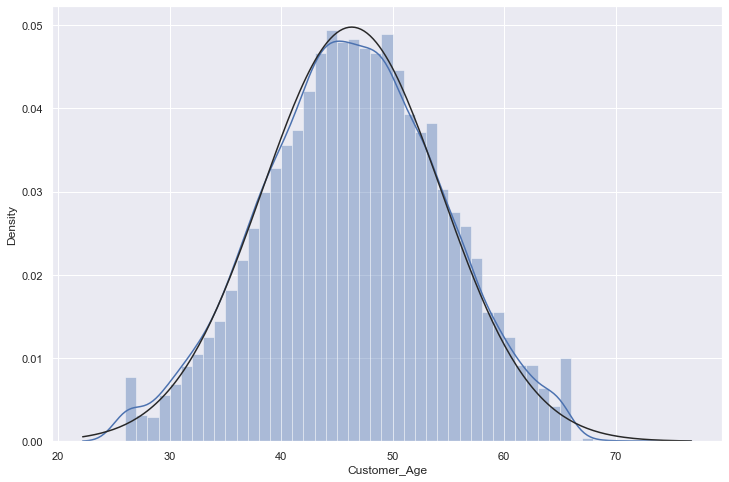

Dependent_count


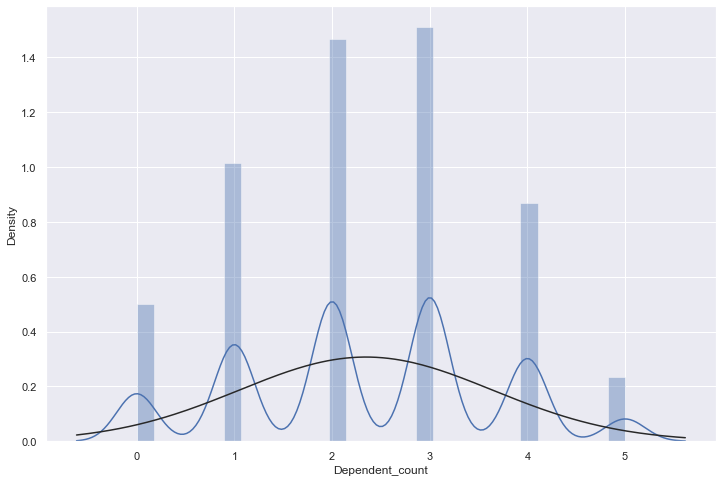

Months_on_book


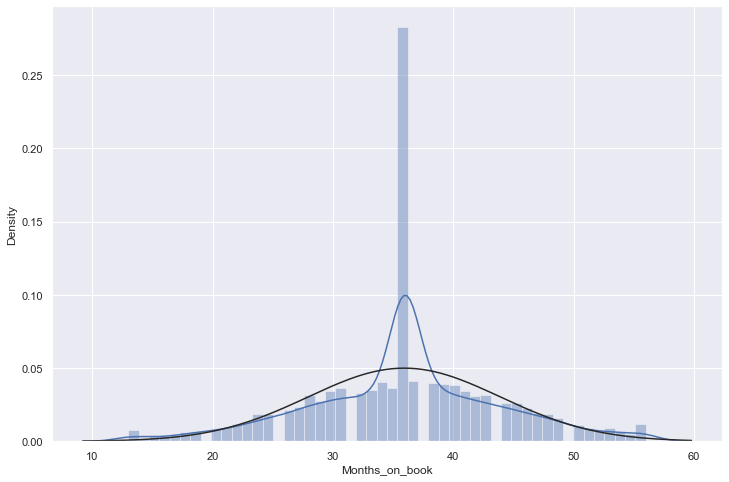

Total_Relationship_Count


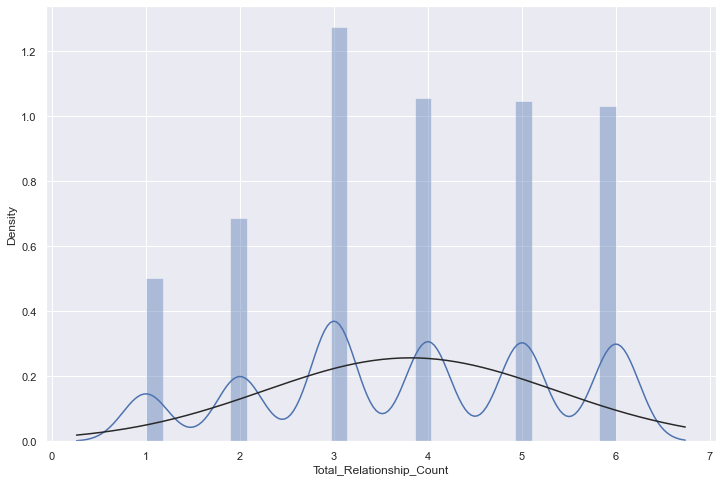

Months_Inactive_12_mon


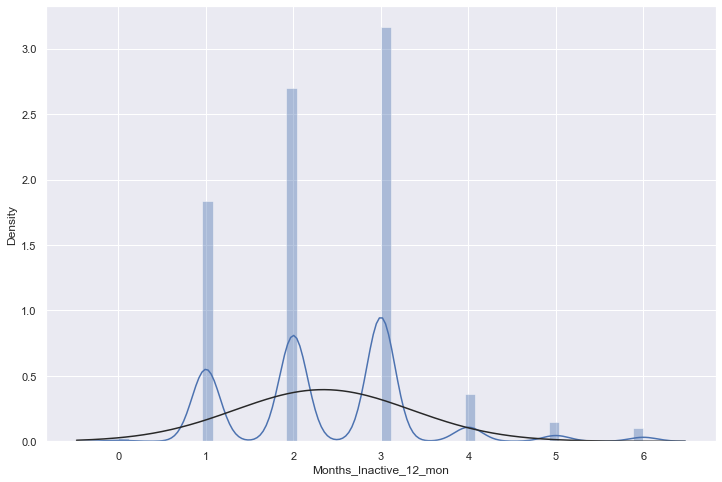

Contacts_Count_12_mon


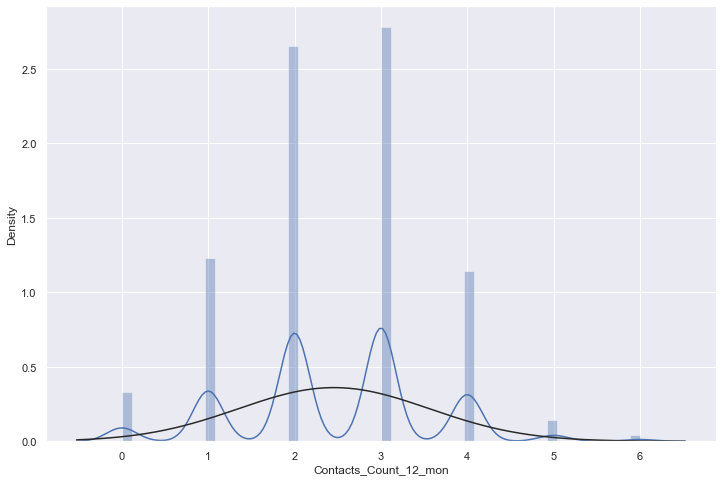

Credit_Limit


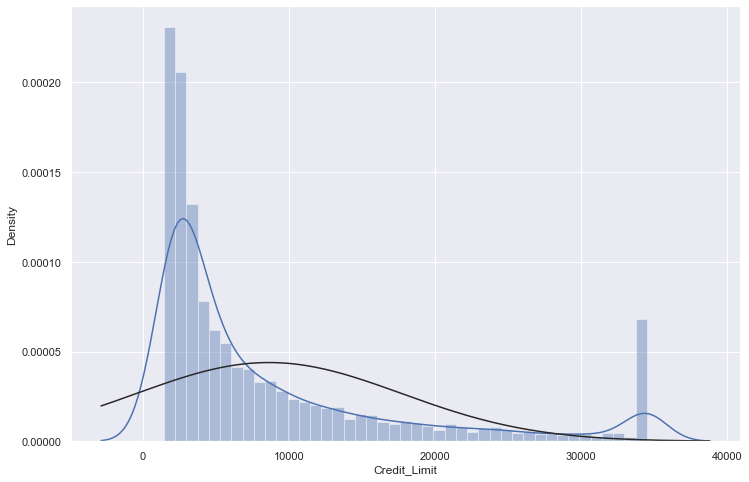

Total_Revolving_Bal


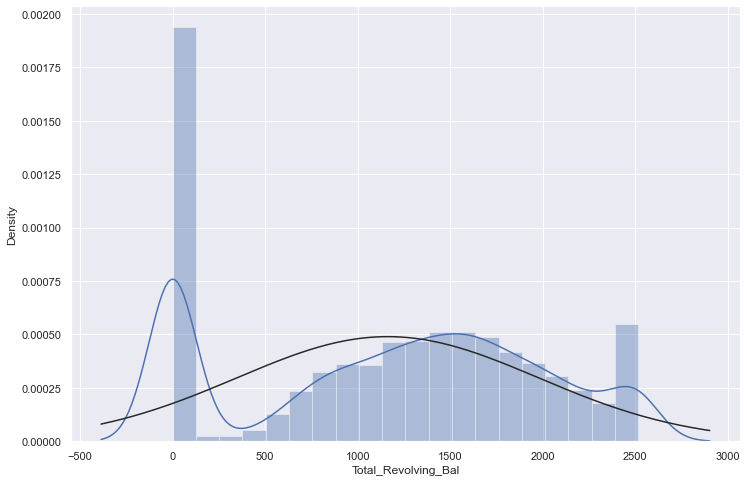

Avg_Open_To_Buy


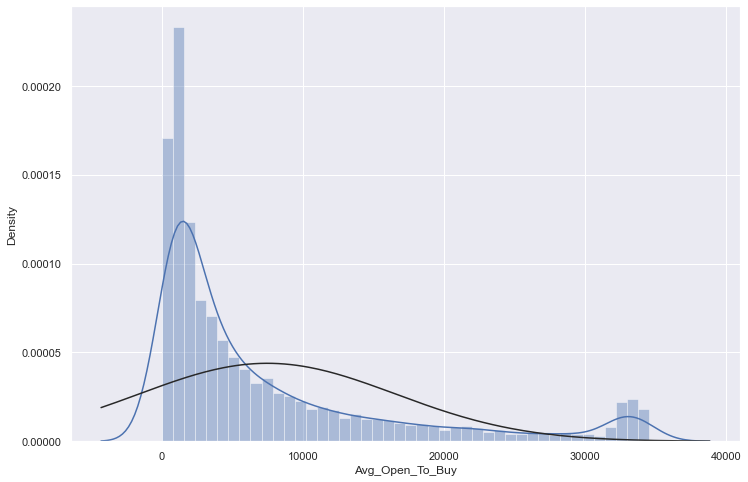

Total_Amt_Chng_Q4_Q1


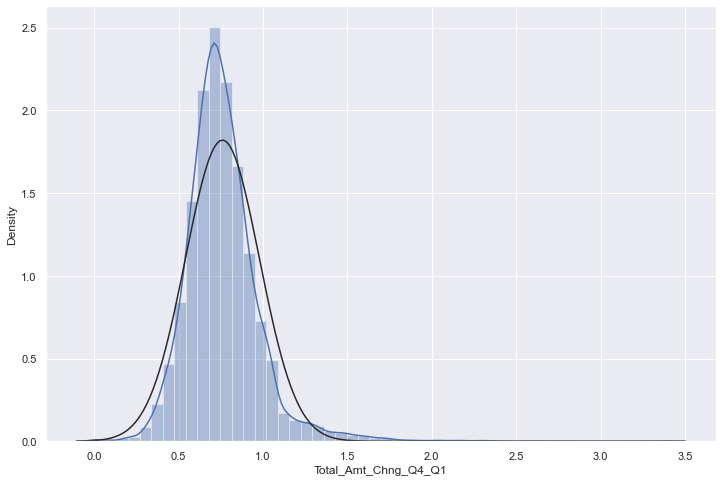

Total_Trans_Amt


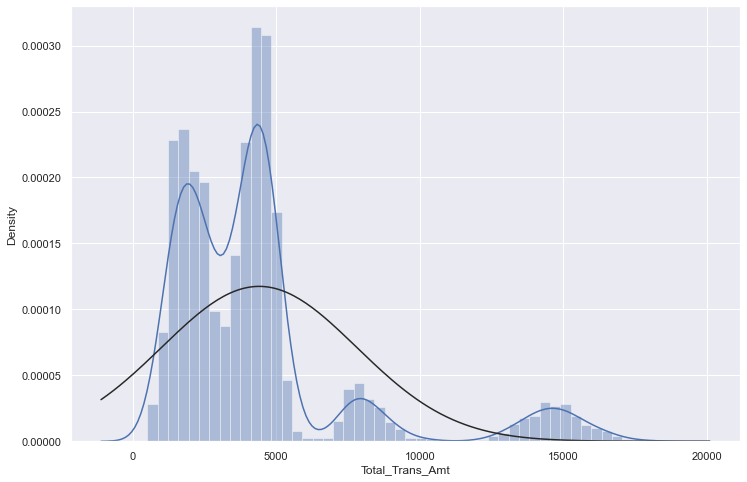

Total_Trans_Ct


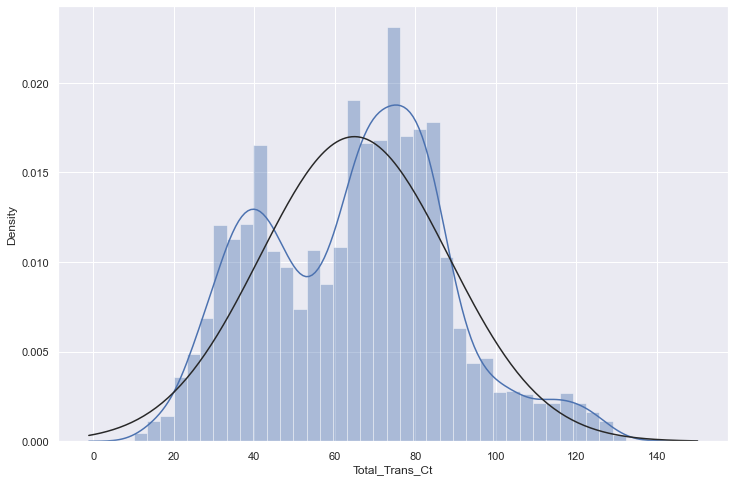

Total_Ct_Chng_Q4_Q1


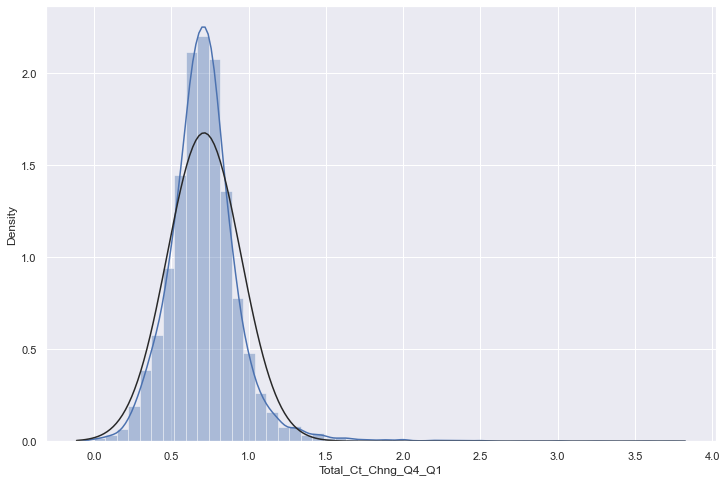

Avg_Utilization_Ratio


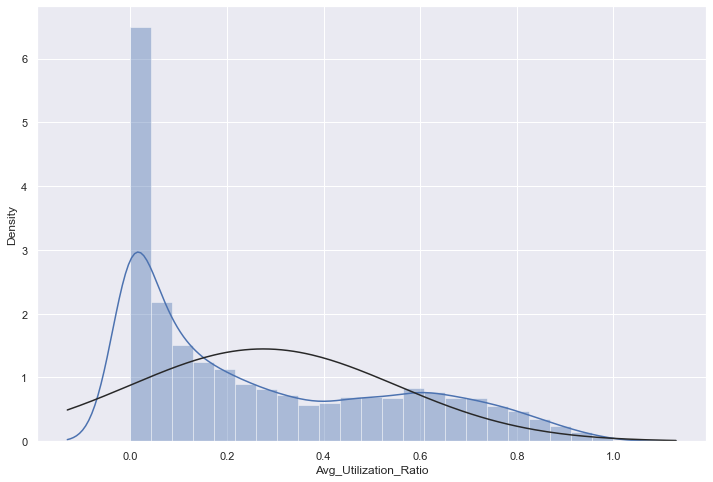

In [19]:
for i in dfContinous:
    print(i)
    x = plot_skew(i)
    plt.show()

In [20]:
def plot_skewdetails(column): 
    mean=dfContinous[column].mean()
    median=dfContinous[column].median()
    mode=dfContinous[column].mode()
    skew = dfContinous[column].skew()

    print('Mean: ',mean,'\nMedian: ',median,'\nMode: ',mode[0],'\nSkew: ',skew)

    #plt.figure(figsize=(10,5)) # set the figure size
    plt.hist(dfContinous[column],bins=100,color='lightblue') #Plot the histogram

    plt.axvline(mean,color='green',label='Mean')     # Draw lines on the plot for mean median and the two modes we have in GRE Score
    plt.axvline(median,color='blue',label='Median')
    plt.axvline(mode[0],color='red',label='Mode1')
    #plt.axvline(mode[1],color='red',label='Mode2')

    #plt.xlabel(column)   # label the x-axis
    plt.ylabel('Frequency')   # label the y-axis
    plt.legend()              # Plot the legend
    plt.show()

Customer_Age
Mean:  46.32596030413745 
Median:  46.0 
Mode:  44 
Skew:  -0.033605016317173456


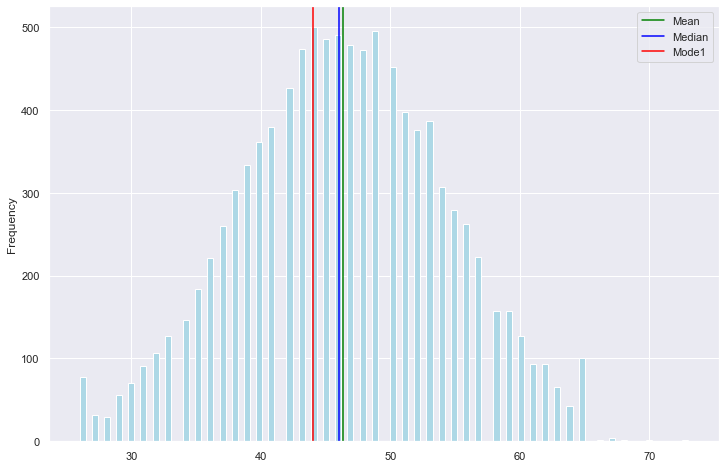

Dependent_count
Mean:  2.3462032191172115 
Median:  2.0 
Mode:  3 
Skew:  -0.020825535616339912


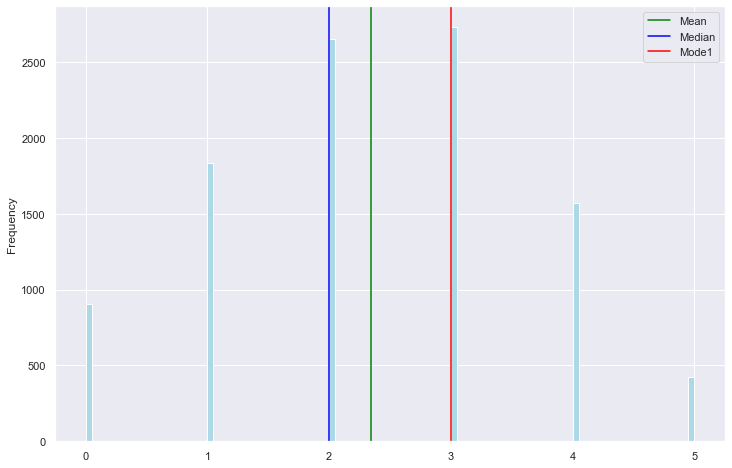

Months_on_book
Mean:  35.928409203120374 
Median:  36.0 
Mode:  36 
Skew:  -0.10656535989402989


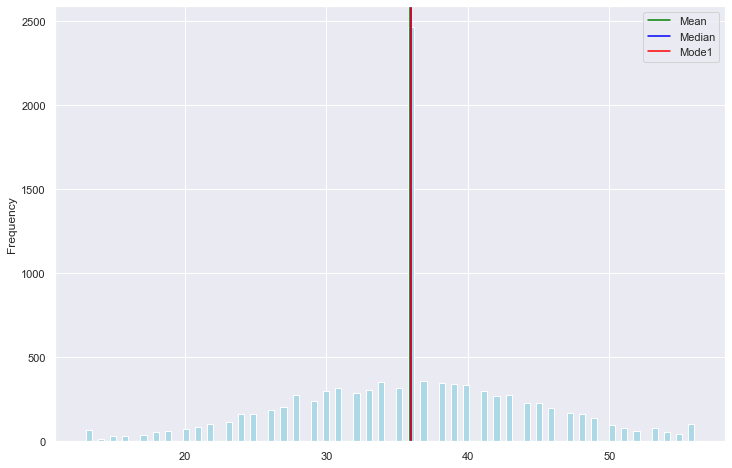

Total_Relationship_Count
Mean:  3.8125802310654686 
Median:  4.0 
Mode:  3 
Skew:  -0.16245241498173682


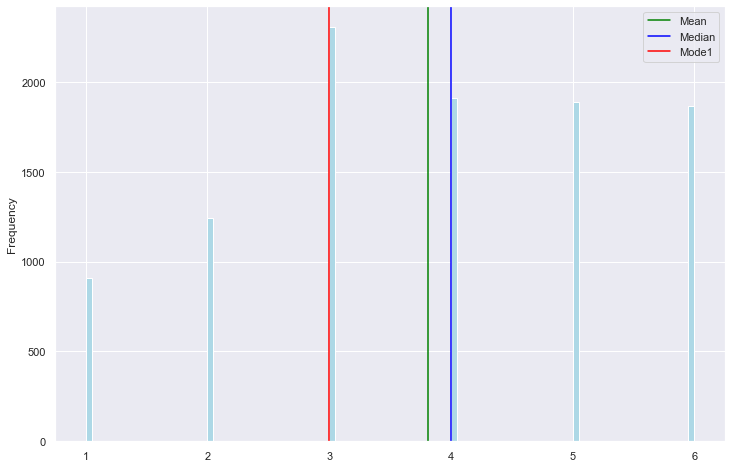

Months_Inactive_12_mon
Mean:  2.3411671768539546 
Median:  2.0 
Mode:  3 
Skew:  0.6330611289713137


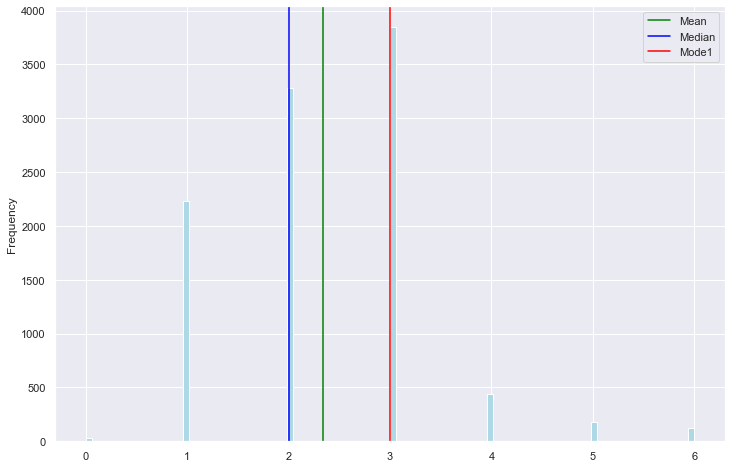

Contacts_Count_12_mon
Mean:  2.4553174681544387 
Median:  2.0 
Mode:  3 
Skew:  0.011005626218976492


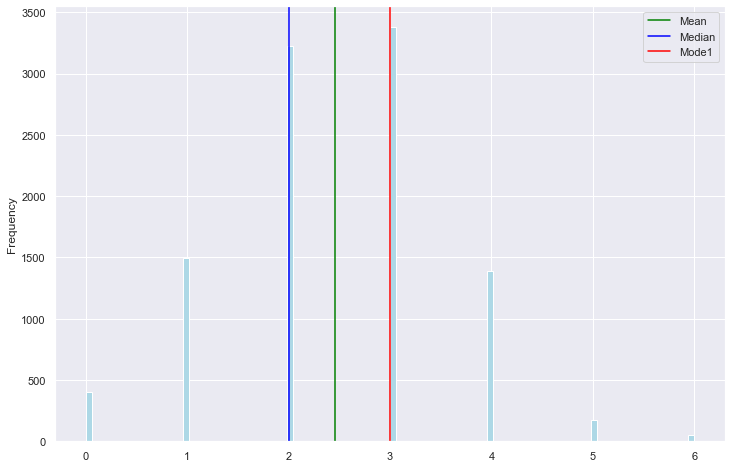

Credit_Limit
Mean:  8631.953698034848 
Median:  4549.0 
Mode:  34516.0 
Skew:  1.666725807993647


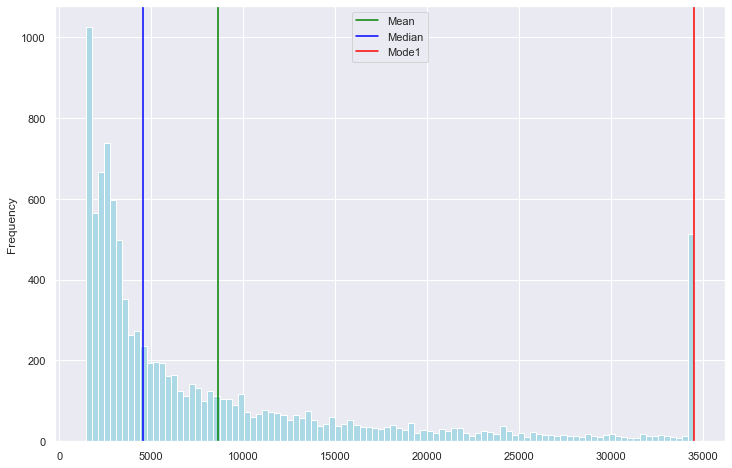

Total_Revolving_Bal
Mean:  1162.8140614199665 
Median:  1276.0 
Mode:  0 
Skew:  -0.14883725028007228


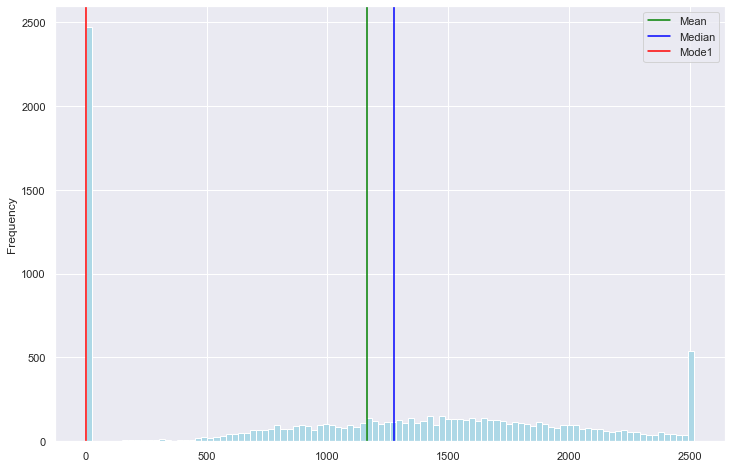

Avg_Open_To_Buy
Mean:  7469.139636614887 
Median:  3474.0 
Mode:  1438.3 
Skew:  1.6616965459311595


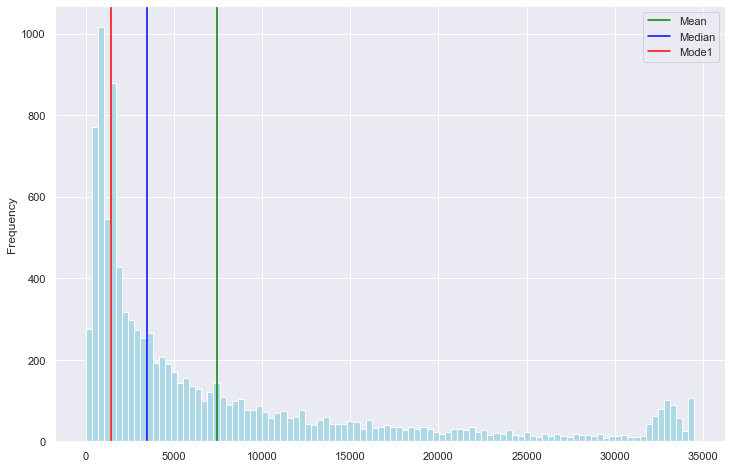

Total_Amt_Chng_Q4_Q1
Mean:  0.7599406536980376 
Median:  0.736 
Mode:  0.7909999999999999 
Skew:  1.7320634114286024


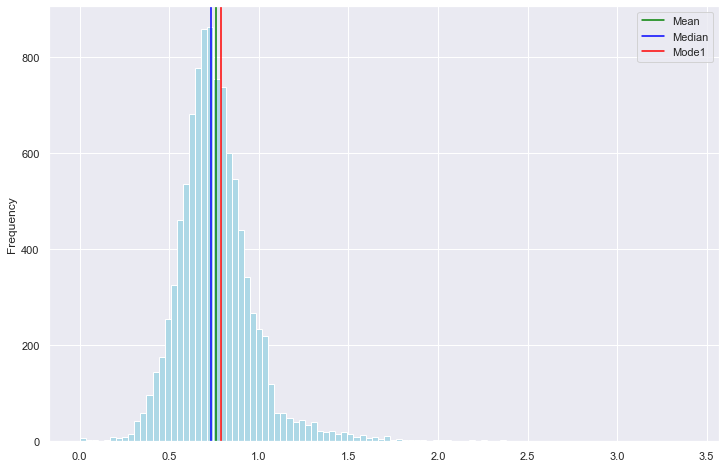

Total_Trans_Amt
Mean:  4404.086303939963 
Median:  3899.0 
Mode:  4253 
Skew:  2.0410034025756936


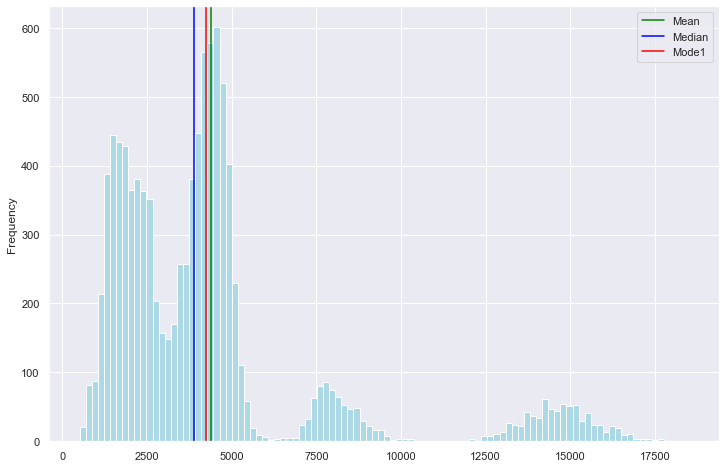

Total_Trans_Ct
Mean:  64.85869457884863 
Median:  67.0 
Mode:  81 
Skew:  0.15367306849872275


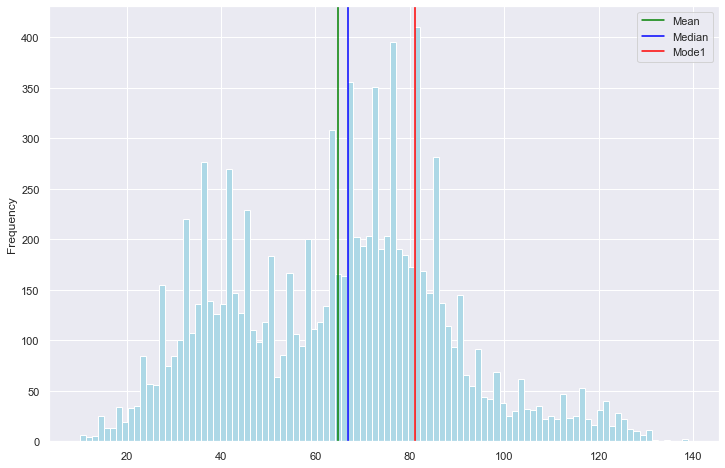

Total_Ct_Chng_Q4_Q1
Mean:  0.7122223758269962 
Median:  0.7020000000000001 
Mode:  0.667 
Skew:  2.0640305679077477


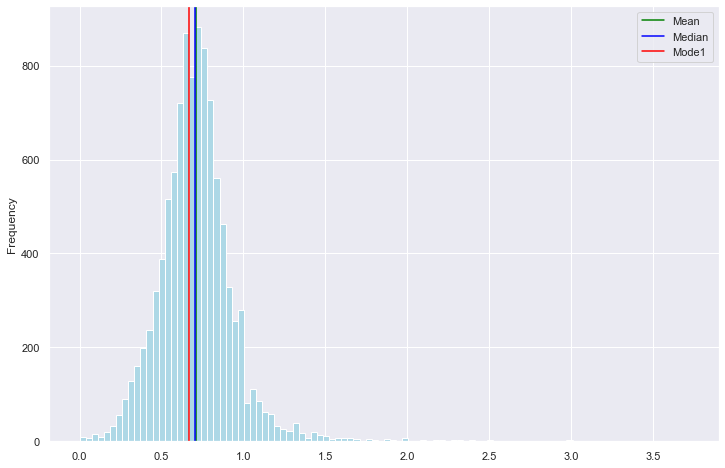

Avg_Utilization_Ratio
Mean:  0.2748935518909845 
Median:  0.17600000000000002 
Mode:  0.0 
Skew:  0.7180079967731994


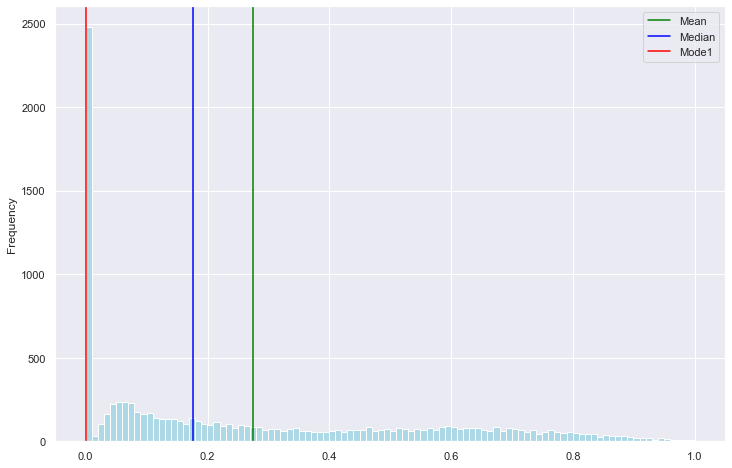

In [21]:
for i in dfContinous:
    print(i)
    plot_skewdetails(i)

In [25]:
features = [col for col in dfCategorical.columns if col !='Attrition_Flag']

In [26]:
def countplot_p1(dataframe):
    features = [col for col in dataframe.columns]
    fig, axs = plt.subplots(nrows = len(features),figsize=(14,len(features)*6.5))
    for idx,features in enumerate(features):
        #plt.subplot(plot_count, 1, index + 1)
        #print(features)
        
        ax =sns.countplot(x=features,  
                    data = dataframe,
                    ax = axs[idx]);
        ax.set_ylabel('')
        
        #without_hue(ax,features)

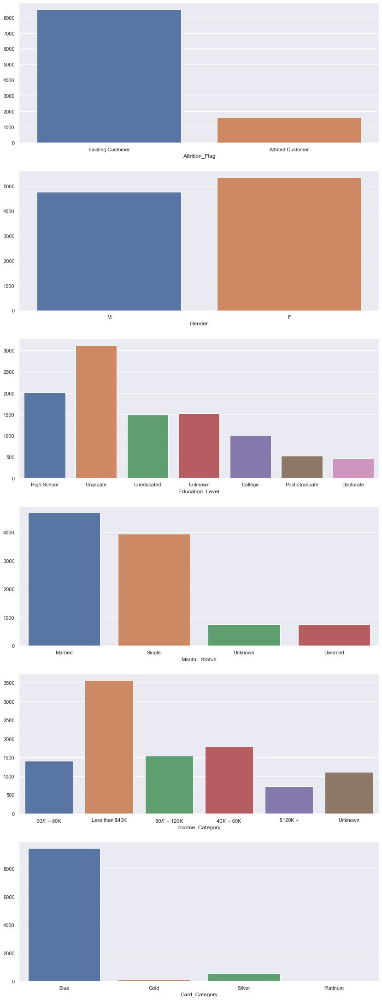

In [27]:
countplot_p1(dfCategorical)

In [29]:
for feature in features:
    print(feature)
    print("")
    print(df[feature].value_counts(normalize=True)*100)
    print("")

Gender

F   52.91
M   47.09
Name: Gender, dtype: float64

Education_Level

Graduate        30.89
High School     19.88
Unknown         15.00
Uneducated      14.68
College         10.00
Post-Graduate    5.10
Doctorate        4.45
Name: Education_Level, dtype: float64

Marital_Status

Married    46.28
Single     38.94
Unknown     7.40
Divorced    7.39
Name: Marital_Status, dtype: float64

Income_Category

Less than $40K   35.16
$40K - $60K      17.68
$80K - $120K     15.16
$60K - $80K      13.84
Unknown          10.98
$120K +           7.18
Name: Income_Category, dtype: float64

Card_Category

Blue       93.18
Silver      5.48
Gold        1.15
Platinum    0.20
Name: Card_Category, dtype: float64



<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#C43104;">  Target Column

In [32]:
df['Attrition_Flag'].value_counts(normalize=True)*100

Existing Customer   83.93
Attrited Customer   16.07
Name: Attrition_Flag, dtype: float64

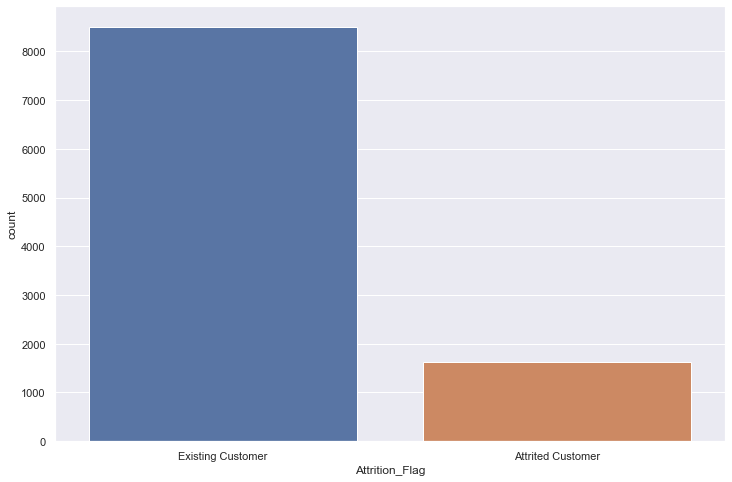

In [33]:
sns.countplot(df['Attrition_Flag']);

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#6E6E6E;">  Bivariate Analysis

In [34]:
df.groupby(["Attrition_Flag"]).mean()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,
Attrited Customer,46.66,2.40,36.18,3.28,2.69,2.97,"8,136.04",672.82,"7,463.22",0.69,"3,095.03",44.93,0.55,0.16
Existing Customer,46.26,2.34,35.88,3.91,2.27,2.36,"8,726.88","1,256.60","7,470.27",0.77,"4,654.66",68.67,0.74,0.30


In [35]:
df.groupby(["Attrition_Flag"]).median()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,
Attrited Customer,47,2,36,3,3,3,"4,178.00",0,"3,488.00",0.70,2329,43,0.53,0.00
Existing Customer,46,2,36,4,2,2,"4,643.50",1364,"3,469.50",0.74,4100,71,0.72,0.21


In [40]:
dfContinous = df.select_dtypes(include=['float64',"int64"])

In [41]:
dfContinous['Attrition_Flag'] = df['Attrition_Flag']

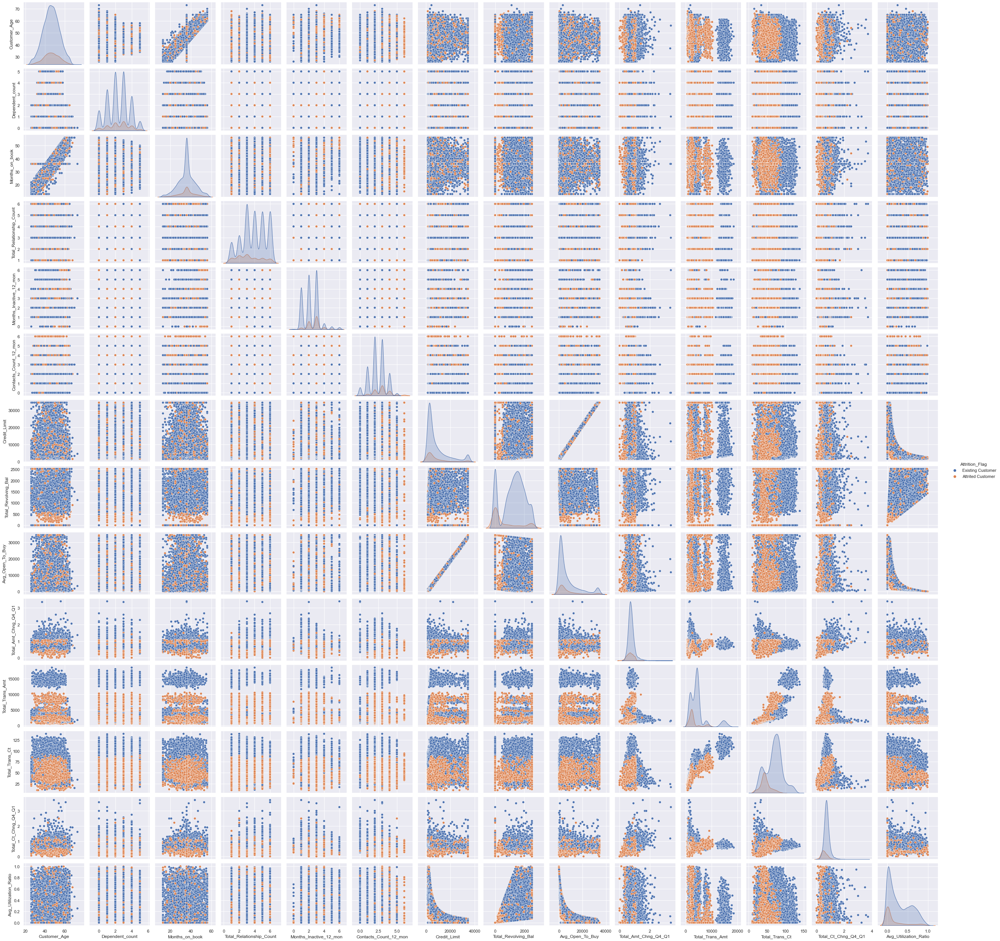

In [42]:
sns.set({'figure.figsize': (12,8)})
sns.pairplot(dfContinous, hue = 'Attrition_Flag')
plt.show()

In [43]:
dfContinous.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Attrition_Flag'],
      dtype='object')

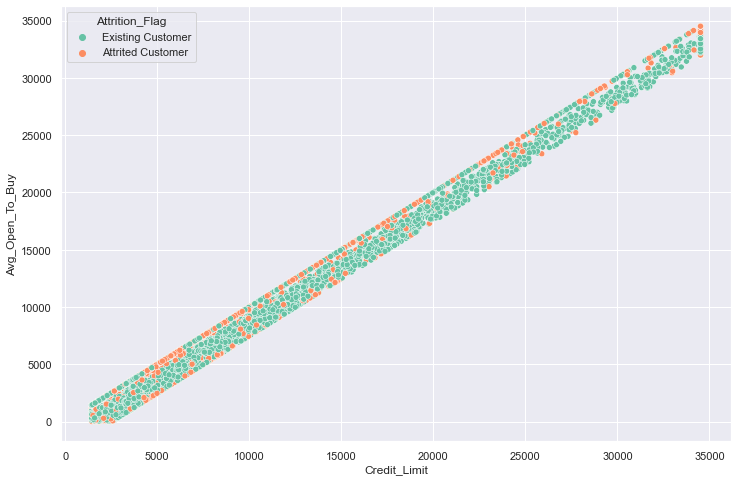

In [48]:
sns.scatterplot(dfContinous['Credit_Limit'], dfContinous['Avg_Open_To_Buy'], hue=dfContinous['Attrition_Flag'], palette='Set2');

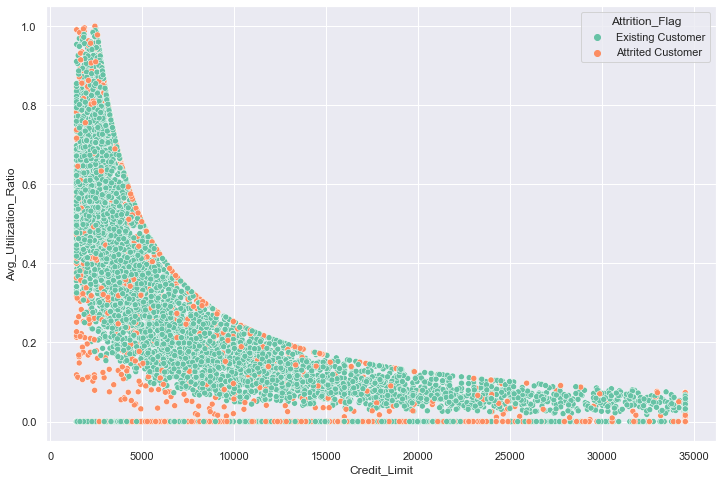

In [49]:
sns.scatterplot(dfContinous['Credit_Limit'], dfContinous['Avg_Utilization_Ratio'], hue=dfContinous['Attrition_Flag'], palette='Set2');

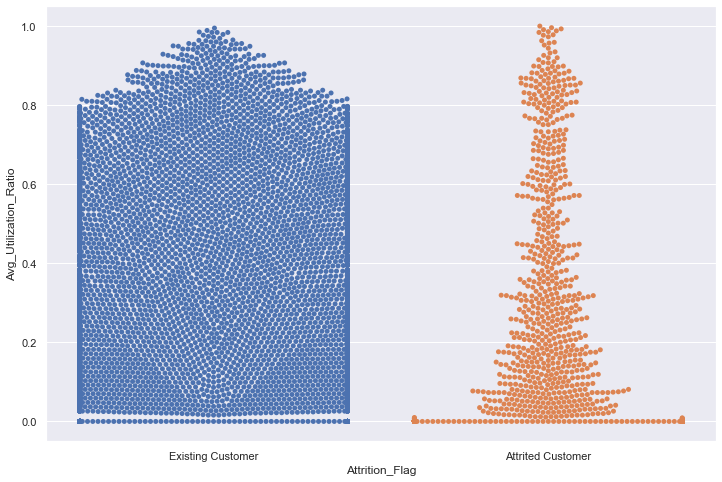

In [51]:
sns.swarmplot(x='Attrition_Flag', y='Avg_Utilization_Ratio', data=dfContinous);

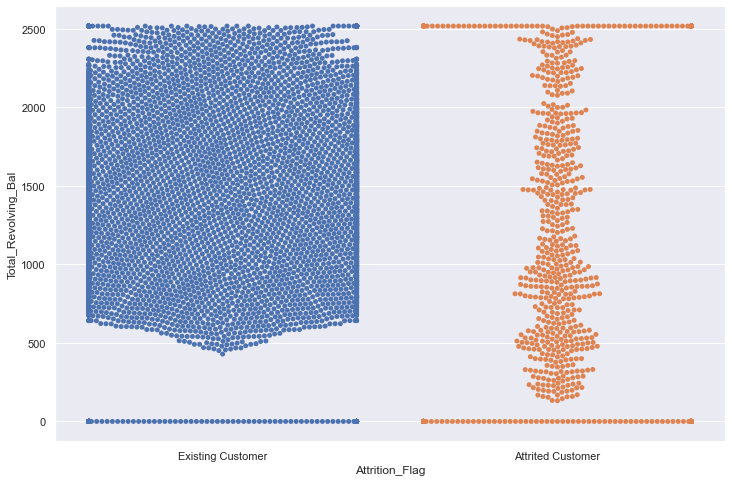

In [52]:
sns.swarmplot(x='Attrition_Flag', y='Total_Revolving_Bal', data=dfContinous);

In [72]:
### Separate Two Data Set For Aanalysis 
dfCustomerdetails = df[['Gender', 'Dependent_count', 'Education_Level','Marital_Status','Income_Category','Card_Category','Attrition_Flag']]
dfCustomerinteraction = df[['Months_Inactive_12_mon', 'Contacts_Count_12_mon','Attrition_Flag']].astype('object')

In [67]:
def countplot_p(dataframe):
    features = [col for col in dataframe.columns if col != 'Attrition_Flag']
    fig, axs = plt.subplots(ncols = len(features),figsize = (30, 9))
    for idx,features in enumerate(features):
        #plt.subplot(plot_count, 1, index + 1)
        #print(features)
        ax = sns.countplot(x=features,  
                    data = dataframe,
                    hue = "Attrition_Flag",
                    ax = axs[idx]);
        ax.set_ylabel('')

        bars = ax.patches
        half = int(len(bars)/2)
        left_bars = bars[:half]
        right_bars = bars[half:]

        for left, right in zip(left_bars, right_bars):
            height_l = left.get_height()
            height_r = right.get_height()
            total = height_l + height_r

            ax.text(left.get_x() + left.get_width()/2., height_l + 40, '{0:.0%}'.format(height_l/total), ha="center")
            ax.text(right.get_x() + right.get_width()/2., height_r + 40, '{0:.0%}'.format(height_r/total), ha="center")

In [62]:
dfCustomerdetails.columns

Index(['Gender', 'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Attrition_Flag'],
      dtype='object')

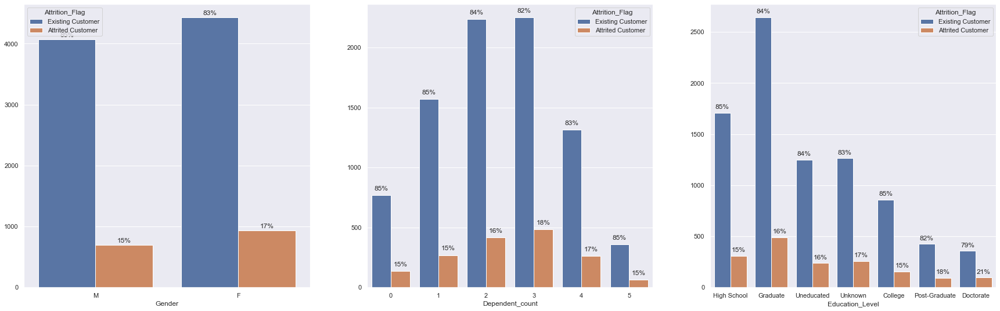

In [69]:
dfCustomerdetails1 = dfCustomerdetails[['Gender', 'Dependent_count', 'Education_Level','Attrition_Flag']]
countplot_p(dfCustomerdetails1)

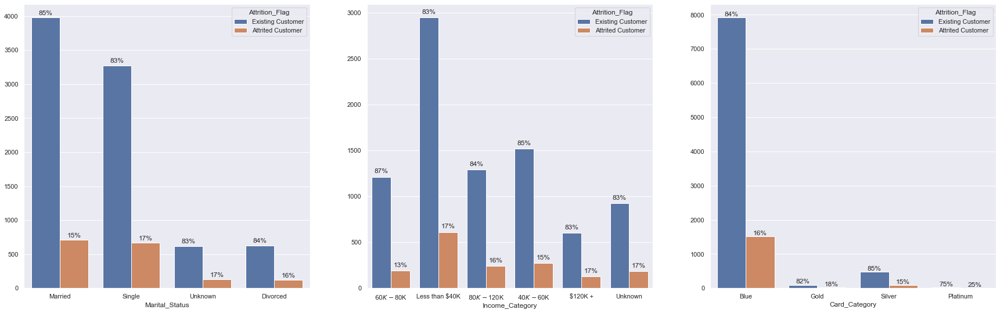

In [73]:
dfCustomerdetails2 = dfCustomerdetails[['Marital_Status','Income_Category','Card_Category','Attrition_Flag']]
countplot_p(dfCustomerdetails2)

posx and posy should be finite values
posx and posy should be finite values


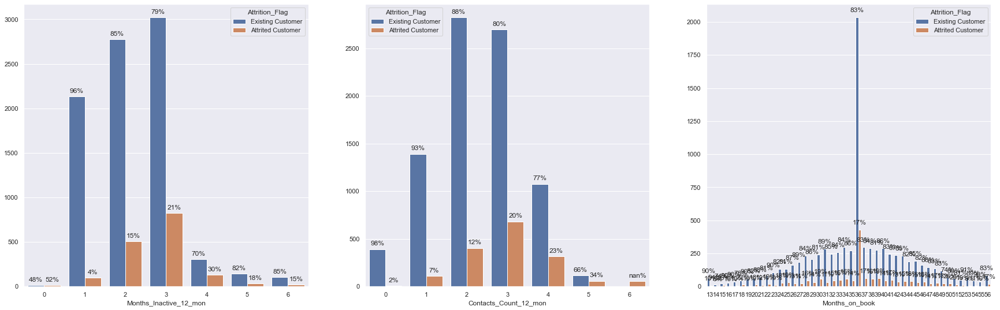

In [65]:
countplot_p(dfCustomerinteraction)

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#6E6E6E;">  Multivariate Analysis

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#C43104;">  Correlation

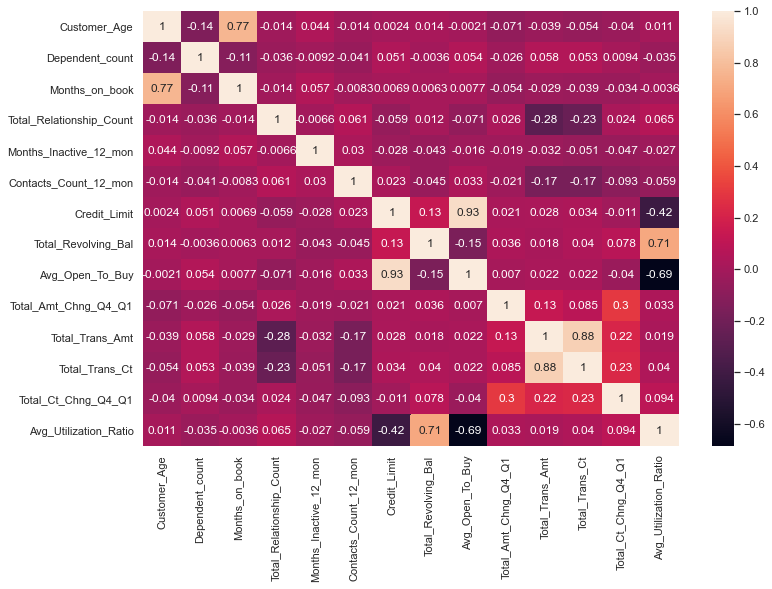

In [74]:
corr = dfContinous.corr('spearman')
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot = True);
plt.show()

In [75]:
df_dummiesshow= pd.get_dummies(df)

In [76]:
df_dummiesshow.head(10)

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,45,3,39,5,1,3,"12,691.00",777,"11,914.00",1.33,...,0,0,1,0,0,0,1,0,0,0
1,49,5,44,6,1,2,"8,256.00",864,"7,392.00",1.54,...,0,0,0,0,1,0,1,0,0,0
2,51,3,36,4,1,0,"3,418.00",0,"3,418.00",2.59,...,0,0,0,1,0,0,1,0,0,0
3,40,4,34,3,4,1,"3,313.00",2517,796.00,1.41,...,0,0,0,0,1,0,1,0,0,0
4,40,3,21,5,1,0,"4,716.00",0,"4,716.00",2.17,...,0,0,1,0,0,0,1,0,0,0
5,44,2,36,3,1,2,"4,010.00",1247,"2,763.00",1.38,...,0,1,0,0,0,0,1,0,0,0
6,51,4,46,6,1,3,"34,516.00",2264,"32,252.00",1.98,...,1,0,0,0,0,0,0,1,0,0
7,32,0,27,2,2,2,"29,081.00",1396,"27,685.00",2.20,...,0,0,1,0,0,0,0,0,0,1
8,37,3,36,5,2,0,"22,352.00",2517,"19,835.00",3.35,...,0,0,1,0,0,0,1,0,0,0
9,48,2,36,6,3,3,"11,656.00",1677,"9,979.00",1.52,...,0,0,0,1,0,0,1,0,0,0


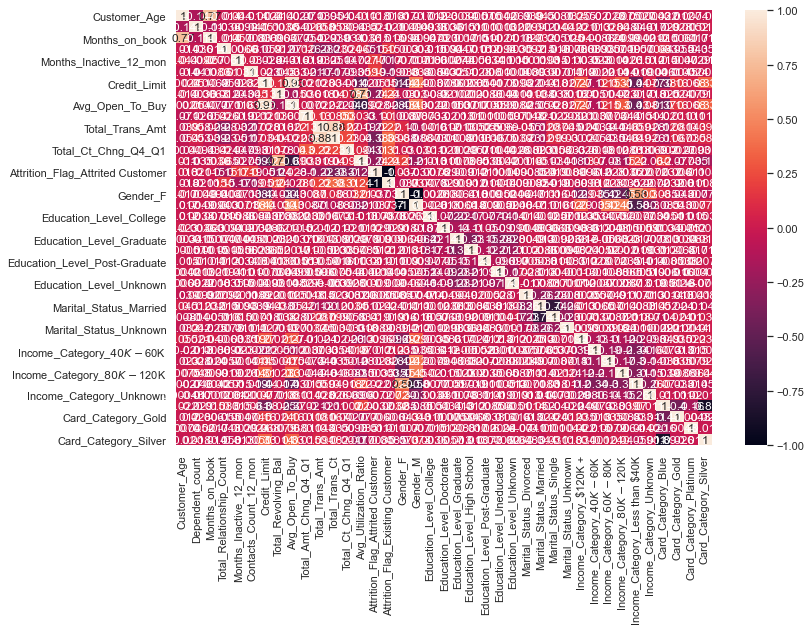

In [77]:
corr = df_dummiesshow.corr('spearman')
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot = True);
plt.show()

In [80]:
df_dummiesshow.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Attrition_Flag_Attrited Customer', 'Attrition_Flag_Existing Customer',
       'Gender_F', 'Gender_M', 'Education_Level_College',
       'Education_Level_Doctorate', 'Education_Level_Graduate',
       'Education_Level_High School', 'Education_Level_Post-Graduate',
       'Education_Level_Uneducated', 'Education_Level_Unknown',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Income_Category_$120K +', 'Income_Category_$40K - $60K',
       'Income_Category_$60K - $80K', 'Income_Category_$80K - $120K',
       'Income_Category_Less than $40K', 'Income_Category_Unknown',
       'C

In [78]:
corrhigh = corr.where(corr > 0.6)

In [82]:
corrhigh

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
Customer_Age,1.00,nan,0.77,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Dependent_count,nan,1.00,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Months_on_book,0.77,nan,1.00,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Relationship_Count,nan,nan,nan,1.00,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Months_Inactive_12_mon,nan,nan,nan,nan,1.00,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Contacts_Count_12_mon,nan,nan,nan,nan,nan,1.00,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Credit_Limit,nan,nan,nan,nan,nan,nan,1.00,nan,0.93,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Revolving_Bal,nan,nan,nan,nan,nan,nan,nan,1.00,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Avg_Open_To_Buy,nan,nan,nan,nan,nan,nan,0.93,nan,1.00,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Amt_Chng_Q4_Q1,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.00,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [83]:
corrlow = corr.where(corr < -0.7 )

In [84]:
corrlow

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
Customer_Age,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Dependent_count,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Months_on_book,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Relationship_Count,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Months_Inactive_12_mon,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Contacts_Count_12_mon,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Credit_Limit,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Revolving_Bal,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Avg_Open_To_Buy,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Total_Amt_Chng_Q4_Q1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [86]:
corr['Attrition_Flag_Existing_Customer'] = corr['Attrition_Flag_Existing Customer']

In [88]:
corr.Attrition_Flag_Existing_Customer

Customer_Age                       -0.02
Dependent_count                    -0.02
Months_on_book                     -0.02
Total_Relationship_Count            0.15
Months_Inactive_12_mon             -0.17
Contacts_Count_12_mon              -0.19
Credit_Limit                        0.05
Total_Revolving_Bal                 0.24
Avg_Open_To_Buy                    -0.03
Total_Amt_Chng_Q4_Q1                0.10
Total_Trans_Amt                     0.22
Total_Trans_Ct                      0.38
Total_Ct_Chng_Q4_Q1                 0.31
Avg_Utilization_Ratio               0.24
Attrition_Flag_Attrited Customer   -1.00
Attrition_Flag_Existing Customer    1.00
Gender_F                           -0.04
Gender_M                            0.04
Education_Level_College             0.01
Education_Level_Doctorate          -0.03
Education_Level_Graduate            0.01
Education_Level_High School         0.01
Education_Level_Post-Graduate      -0.01
Education_Level_Uneducated          0.00
Education_Level_

In [89]:
def conditional_entropy(x,y):
    # entropy of x given y
    y_counter = Counter(y)
    xy_counter = Counter(list(zip(x,y)))
    total_occurrences = sum(y_counter.values())
    entropy = 0
    for xy in xy_counter.keys():
        p_xy = xy_counter[xy] / total_occurrences
        p_y = y_counter[xy[1]] / total_occurrences
        entropy += p_xy * math.log(p_y/p_xy)
    return entropy

def theil_u(x,y):
    s_xy = conditional_entropy(x,y)
    x_counter = Counter(x)
    total_occurrences = sum(x_counter.values())
    p_x = list(map(lambda n: n/total_occurrences, x_counter.values()))
    s_x = ss.entropy(p_x)
    if s_x == 0:
        return 1
    else:
        return (s_x - s_xy) / s_x

In [90]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [93]:
df2 = dfCategorical.copy()

Attrition_Flag :  1.0
Gender :  0.0015817568407480687
Education_Level :  0.001332399088387325
Marital_Status :  0.0006788219570874179
Income_Category :  0.0014670954824588488
Card_Category :  0.00023522705346999516


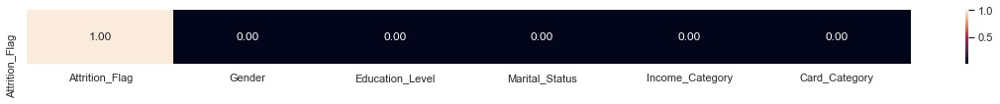

In [95]:
theilu = pd.DataFrame(index=['Attrition_Flag'],columns=df2.columns)
columns = df2.columns
for j in range(0,len(columns)):
    u = theil_u(df2['Attrition_Flag'].tolist(),df2[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
    print(df2[columns[j]].name,": ",u)
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

Attrition_Flag :  1.0
Gender :  0.0015817568407480687
Education_Level :  0.001332399088387325
Marital_Status :  0.0006788219570874179
Income_Category :  0.0014670954824588488
Card_Category :  0.00023522705346999516


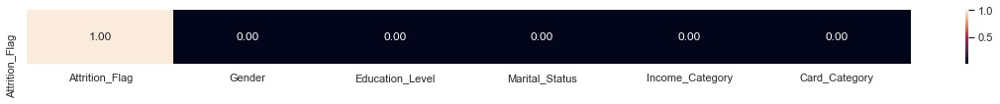

In [96]:
theilu = pd.DataFrame(index=['Attrition_Flag'],columns=df2.columns)
columns = df2.columns
for j in range(0,len(columns)):
    u = theil_u(df2['Attrition_Flag'].tolist(),df2[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
    print(df2[columns[j]].name,": ",u)
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

In [97]:
df2 = df.copy()

Attrition_Flag :  1.0
Customer_Age :  0.00748684997808604
Gender :  0.0015817568407480687
Dependent_count :  0.0010576212280802716
Education_Level :  0.001332399088387325
Marital_Status :  0.0006788219570874179
Income_Category :  0.0014670954824588488
Card_Category :  0.00023522705346999516
Months_on_book :  0.006743168739021259
Total_Relationship_Count :  0.029907303618455495
Months_Inactive_12_mon :  0.04997246705817189
Contacts_Count_12_mon :  0.06054401789614157
Credit_Limit :  0.6475227721385395
Total_Revolving_Bal :  0.3657487470595845
Avg_Open_To_Buy :  0.726115031574472
Total_Amt_Chng_Q4_Q1 :  0.1841314087461736
Total_Trans_Amt :  0.7173595121097788
Total_Trans_Ct :  0.2626513827741347
Total_Ct_Chng_Q4_Q1 :  0.3006656893348524
Avg_Utilization_Ratio :  0.2298074817860192


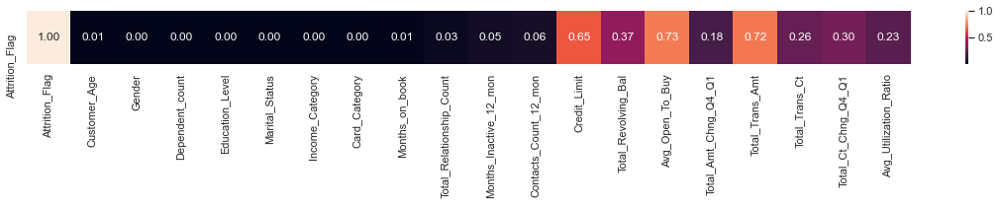

In [98]:
theilu = pd.DataFrame(index=['Attrition_Flag'],columns=df2.columns)
columns = df2.columns
for j in range(0,len(columns)):
    u = theil_u(df2['Attrition_Flag'].tolist(),df2[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
    print(df2[columns[j]].name,": ",u)
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

Attrition_Flag :  1.0
Customer_Age :  0.00748684997808604
Gender :  0.0015817568407480687
Dependent_count :  0.0010576212280802716
Education_Level :  0.001332399088387325
Marital_Status :  0.0006788219570874179
Income_Category :  0.0014670954824588488
Card_Category :  0.00023522705346999516
Months_on_book :  0.006743168739021259
Total_Relationship_Count :  0.029907303618455495
Months_Inactive_12_mon :  0.04997246705817189
Contacts_Count_12_mon :  0.06054401789614157
Credit_Limit :  0.6475227721385395
Total_Revolving_Bal :  0.3657487470595845
Avg_Open_To_Buy :  0.726115031574472
Total_Amt_Chng_Q4_Q1 :  0.1841314087461736
Total_Trans_Amt :  0.7173595121097788
Total_Trans_Ct :  0.2626513827741347
Total_Ct_Chng_Q4_Q1 :  0.3006656893348524
Avg_Utilization_Ratio :  0.2298074817860192


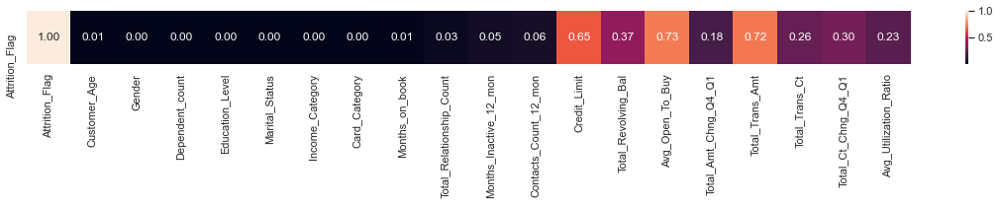

In [99]:
theilu = pd.DataFrame(index=['Attrition_Flag'],columns=df2.columns)
columns = df2.columns
for j in range(0,len(columns)):
    u = theil_u(df2['Attrition_Flag'].tolist(),df2[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
    print(df2[columns[j]].name,": ",u)
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

<a id='EDAInsights'></a>

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#C43104;">  EDA Insights 

######  <span style="font-family: Arial;font-size:1.20em;color:#6E6E6E;"> Univariate Analysis Insights
    
* I've found a strong positive skew on the columnsCredit_Limit,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio . I'll apply feature scaling methods to reduced the skeewnes on the mentioned columns (log-tranform, sqrt or box cox transformation). 
    
* No missing values founded

* Clearly unbalanced distribution on the target variable. Existing Customer (negative label 0)  83.93 vs positive label (1) 16.07. Feature engineering needed and parameter optimization for balanced target.   

* Most of the clients has Blue type card. 
    


###### <span style="font-family: Arial;font-size:1.20em;color:#6E6E6E;"> Bivariate Analysis Insights
    
   * It seems that Total_Revolving_Bal,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Total_Trans_Amt are information that could help our algorithm to learn and then properly classify existing clients. Central Tendencis values show me that there is a significant difference. 
    


###### <span style="font-family: Arial;font-size:1.20em;color:#6E6E6E;"> Multivariate Analysis Insights    
 
    
    3. Found a high correlation between Total_Trans_Ct and Total_Trans_Amt, Total_Revolving_Bal and Avg_Utilization_Ratio, Customer_Age and Months_of Book. Also, I think taht there is a underlaing correlation between Total_Revolving_Bal,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio and the target. Therefore I'll apply PCa as a component of my pipeline to avoid overfitting dueto a possile multicoliniarity problem. 

<a id='Prepo'></a>
#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Data-PreProccesing

#### Missing Values 

In [4]:
dfprep = df.copy()

In [5]:
## Check for missing values 
percent_missing = dfprep.isnull().sum() * 100 / len(dfprep)
missing_value_df = pd.DataFrame({'column_name': dfprep.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
CLIENTNUM,CLIENTNUM,0.00
Attrition_Flag,Attrition_Flag,0.00
Customer_Age,Customer_Age,0.00
Gender,Gender,0.00
Dependent_count,Dependent_count,0.00
Education_Level,Education_Level,0.00
Marital_Status,Marital_Status,0.00
Income_Category,Income_Category,0.00
Card_Category,Card_Category,0.00
Months_on_book,Months_on_book,0.00


There is not Missing Values

Before To study outliers I would like to perform data scaling techniques to solve the skew

#### Feature Scaling 

In [107]:
dfContinous.skew()

Customer_Age               -0.03
Dependent_count            -0.02
Months_on_book             -0.11
Total_Relationship_Count   -0.16
Months_Inactive_12_mon      0.63
Contacts_Count_12_mon       0.01
Credit_Limit                1.67
Total_Revolving_Bal        -0.15
Avg_Open_To_Buy             1.66
Total_Amt_Chng_Q4_Q1        1.73
Total_Trans_Amt             2.04
Total_Trans_Ct              0.15
Total_Ct_Chng_Q4_Q1         2.06
Avg_Utilization_Ratio       0.72
dtype: float64

In [109]:
dfContinous.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Attrition_Flag'],
      dtype='object')

In [113]:
dfskew = dfContinous[['Credit_Limit',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]

Credit_Limit


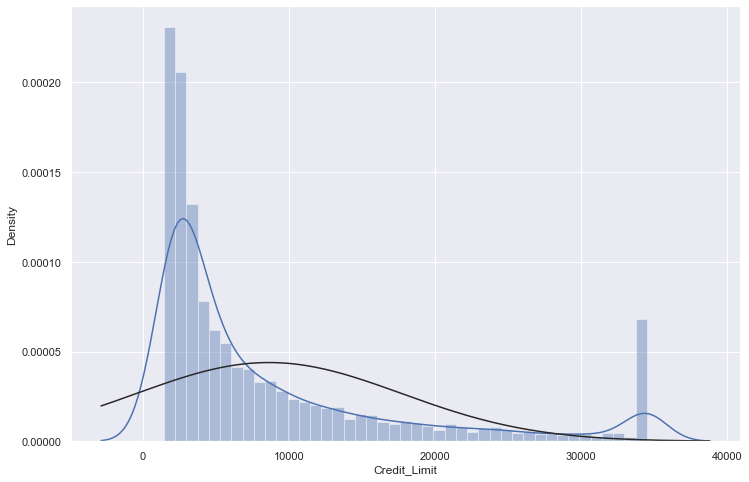

Avg_Open_To_Buy


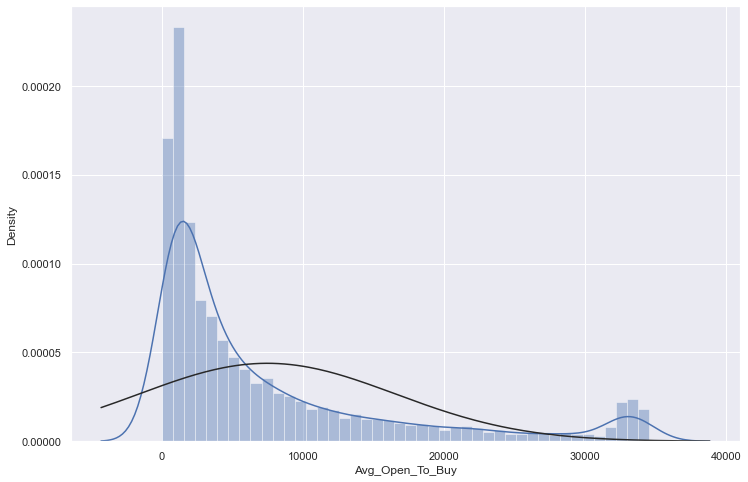

Total_Amt_Chng_Q4_Q1


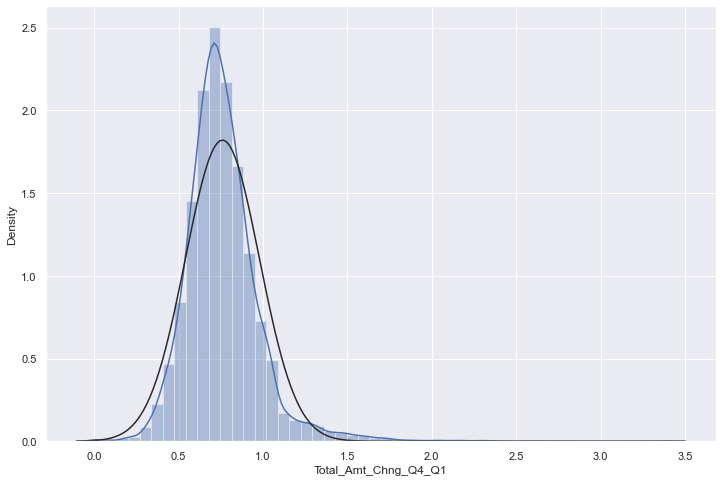

Total_Trans_Amt


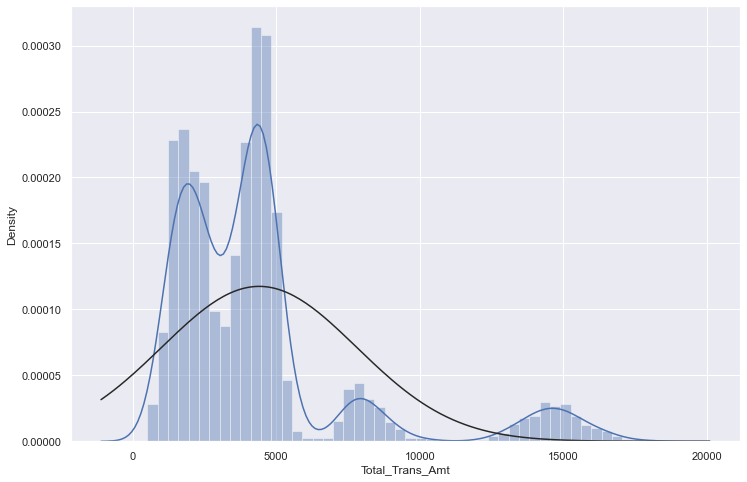

Total_Ct_Chng_Q4_Q1


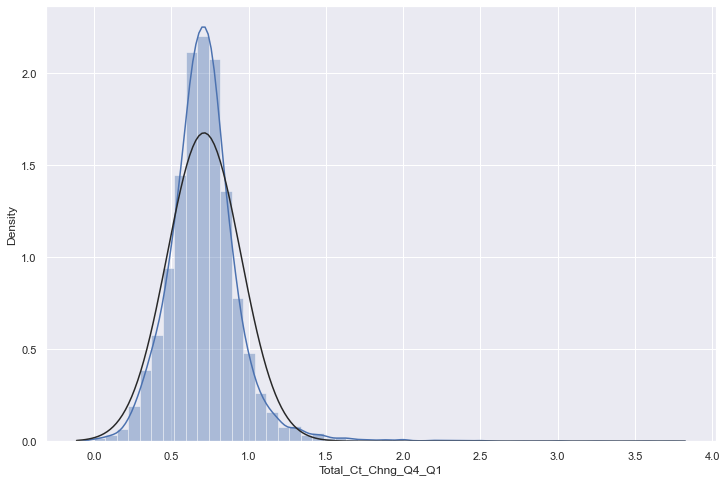

Avg_Utilization_Ratio


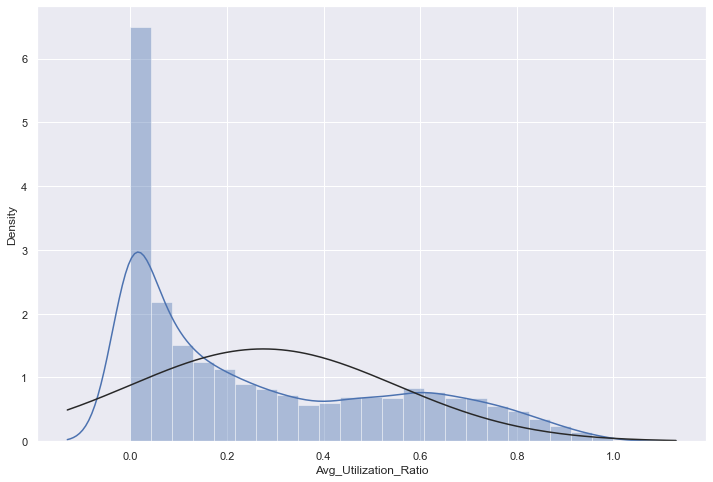

In [114]:
for i in dfskew:
    print(i)
    x = plot_skew(i)
    plt.show()

In [127]:
dfskew.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
Credit_Limit,1.67,1.81
Avg_Open_To_Buy,1.66,1.80
Total_Amt_Chng_Q4_Q1,1.73,9.99
Total_Trans_Amt,2.04,3.89
Total_Ct_Chng_Q4_Q1,2.06,15.69
Avg_Utilization_Ratio,0.72,-0.79


#### Apply Log + 1

In [122]:
dfskew_log = dfskew.applymap(lambda x: np.log(x+1))

In [126]:
dfskew_log.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
Credit_Limit,0.46,-0.89
Avg_Open_To_Buy,-0.10,-0.55
Total_Amt_Chng_Q4_Q1,0.65,3.50
Total_Trans_Amt,0.26,0.01
Total_Ct_Chng_Q4_Q1,0.51,4.08
Avg_Utilization_Ratio,0.52,-1.12


Credit_Limit


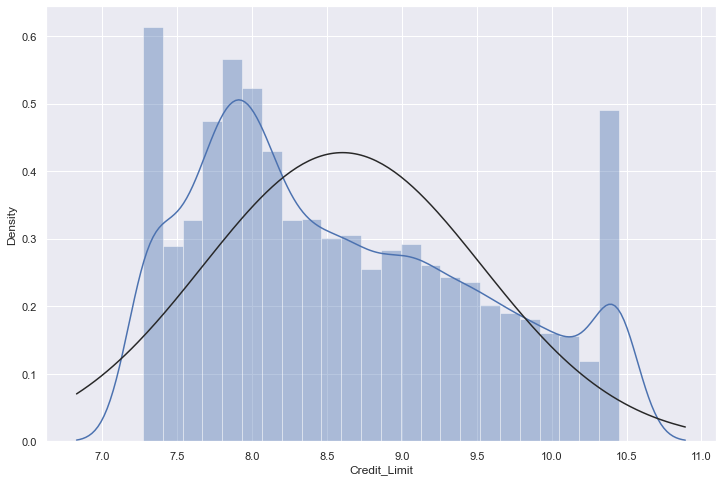

Avg_Open_To_Buy


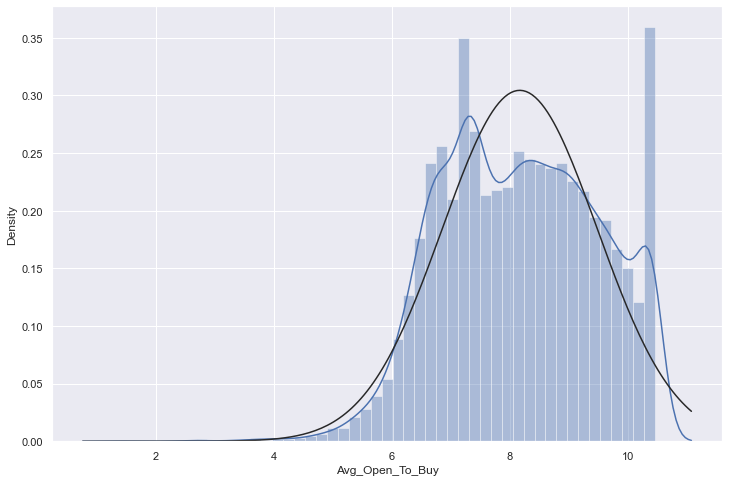

Total_Amt_Chng_Q4_Q1


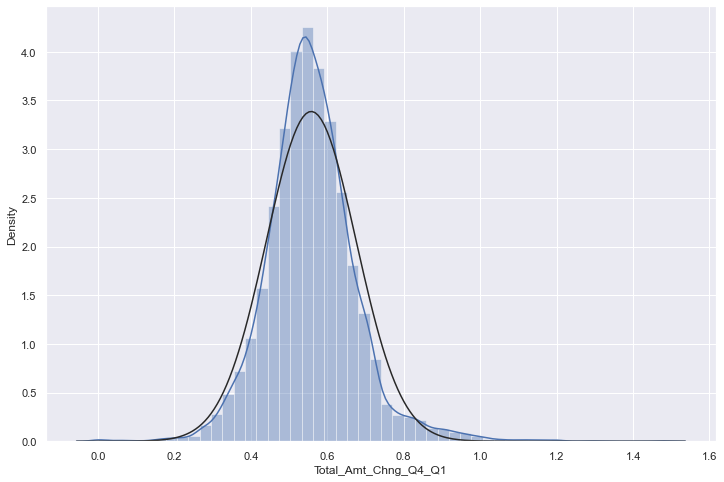

Total_Trans_Amt


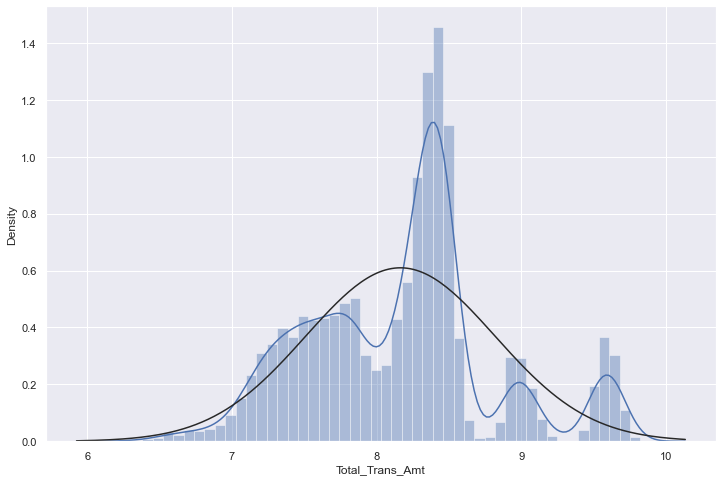

Total_Ct_Chng_Q4_Q1


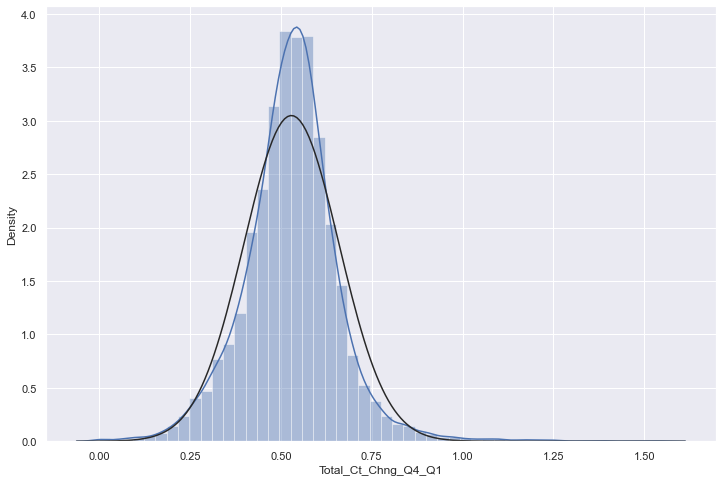

Avg_Utilization_Ratio


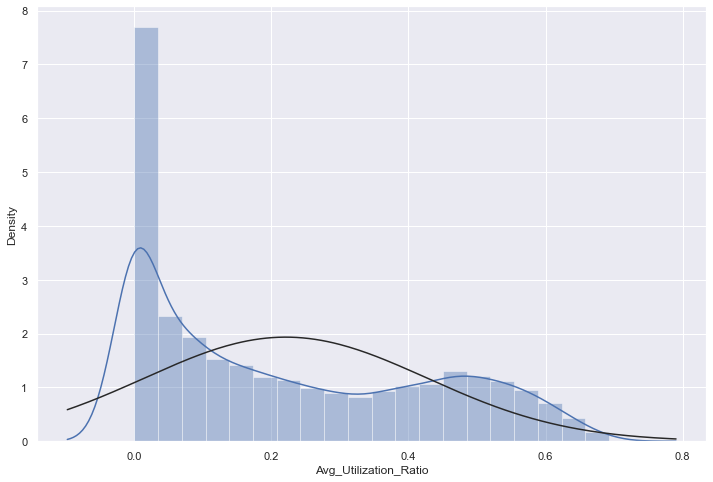

In [137]:
def plot_skew(column): 
    sns.distplot(dfskew_log[column],fit=stats.norm, kde=True);
    
for i in dfskew_log:
    print(i)
    x = plot_skew(i)
    plt.show()

#### sqrt

In [138]:
dfskew_sqrt = dfskew.applymap(lambda x: np.sqrt(x))

In [139]:
dfskew_sqrt.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
Credit_Limit,1.09,0.16
Avg_Open_To_Buy,0.94,-0.10
Total_Amt_Chng_Q4_Q1,0.39,4.80
Total_Trans_Amt,1.22,1.48
Total_Ct_Chng_Q4_Q1,0.22,5.02
Avg_Utilization_Ratio,0.00,-1.31


Credit_Limit


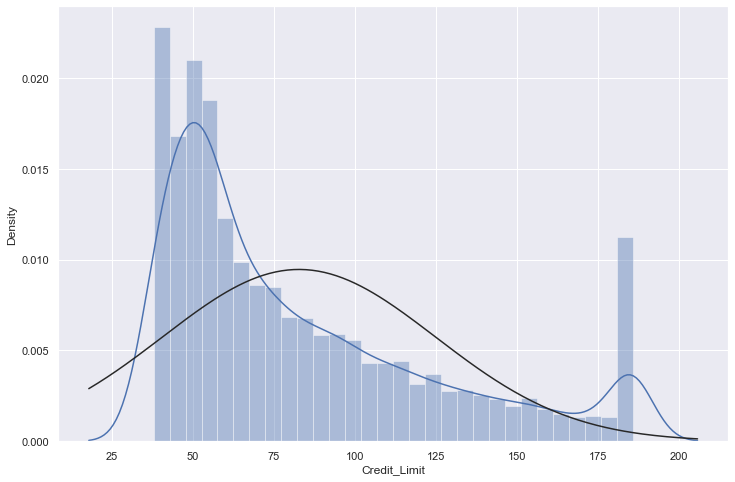

Avg_Open_To_Buy


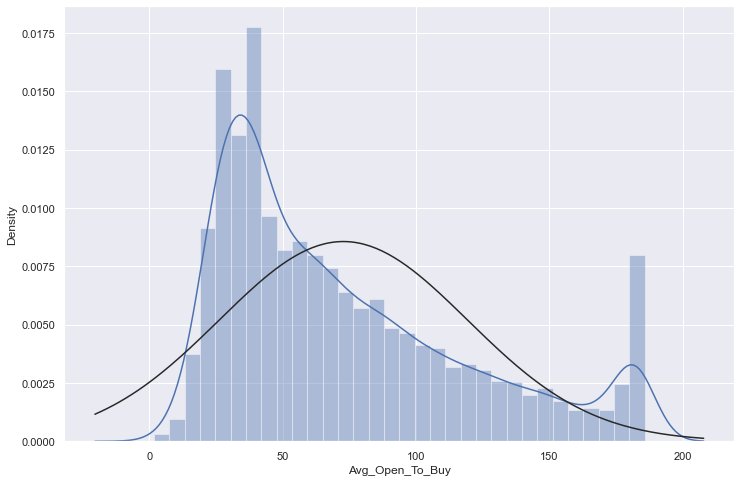

Total_Amt_Chng_Q4_Q1


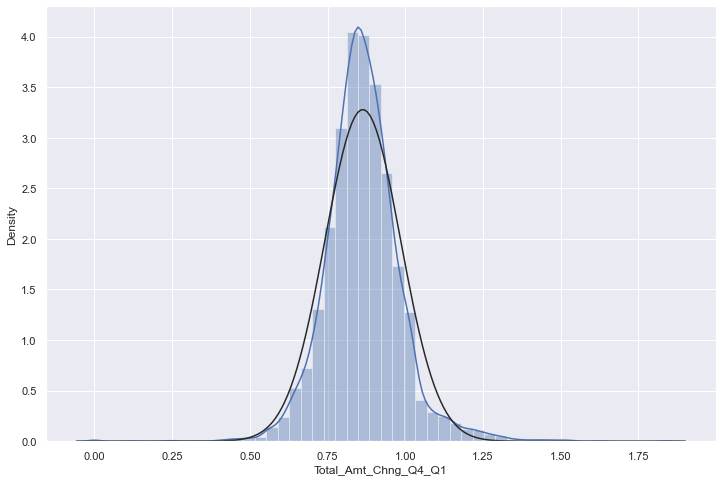

Total_Trans_Amt


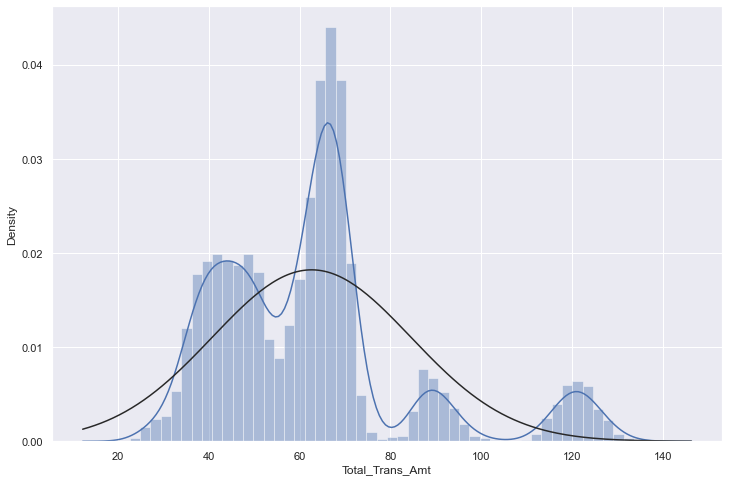

Total_Ct_Chng_Q4_Q1


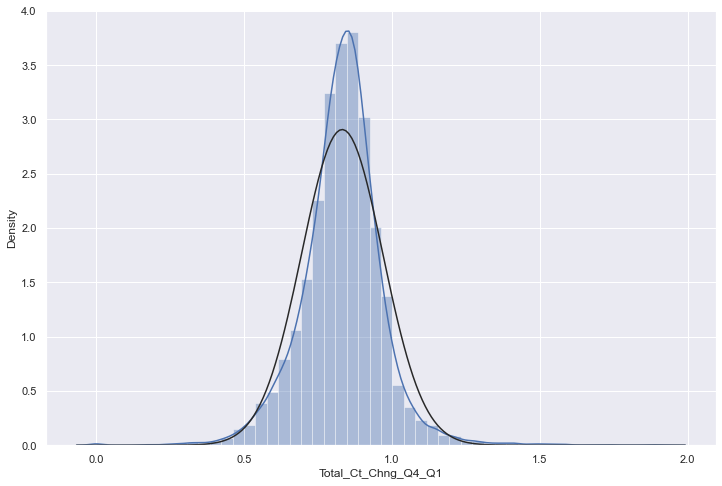

Avg_Utilization_Ratio


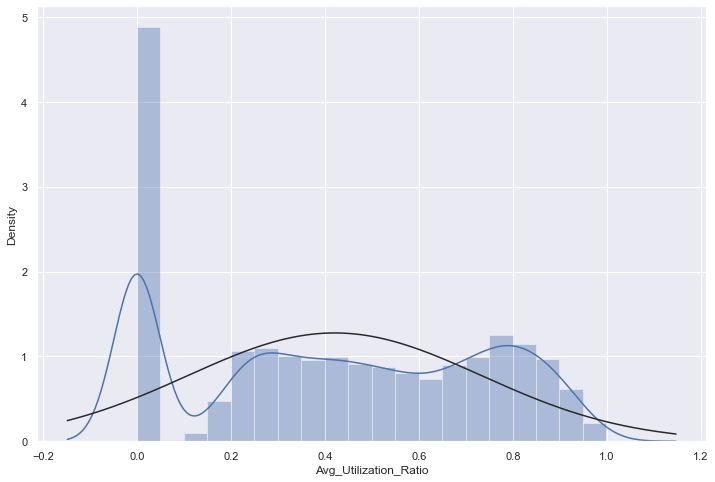

In [140]:
def plot_skew(column): 
    sns.distplot(dfskew_sqrt[column],fit=stats.norm, kde=True);
    
for i in dfskew_sqrt:
    print(i)
    x = plot_skew(i)
    plt.show()

#### Outliers

In [145]:
dfContinous.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Attrition_Flag'],
      dtype='object')

In [150]:
dfoutliers1=dfContinous[['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon','Total_Amt_Chng_Q4_Q1', 
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]

dfoutliers2=dfContinous[['Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Trans_Amt']]

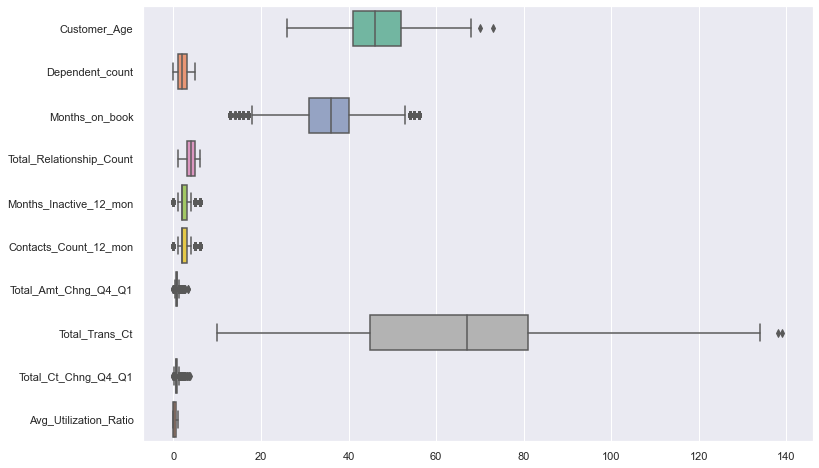

In [151]:
ax = sns.boxplot(data=dfoutliers1, orient="h", palette="Set2")

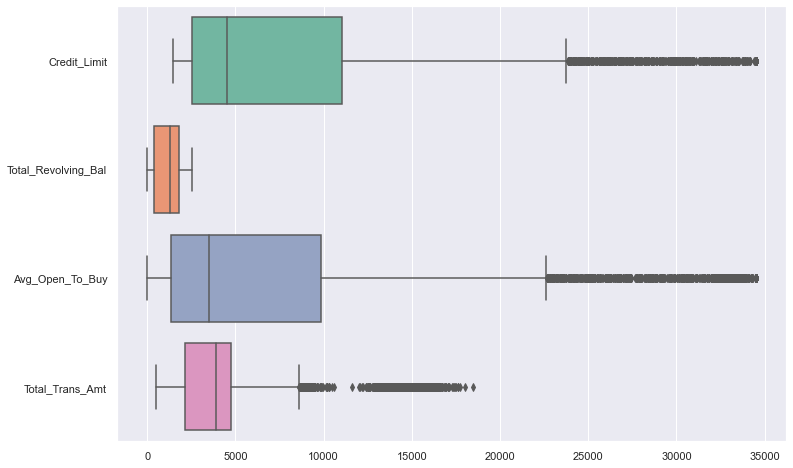

In [152]:
ax = sns.boxplot(data=dfoutliers2, orient="h", palette="Set2")

## After log transf

In [43]:
features = ['Credit_Limit',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

In [44]:
dfoutliers_log = df.copy()
for feature in features: 
    dfoutliers_log[feature] = dfoutliers_log[feature].apply(lambda x: np.log(x+1))

In [45]:
dfoutliers_log.skew()

Customer_Age               -0.03
Dependent_count            -0.02
Months_on_book             -0.11
Total_Relationship_Count   -0.16
Months_Inactive_12_mon      0.63
Contacts_Count_12_mon       0.01
Credit_Limit                0.46
Total_Revolving_Bal        -0.15
Avg_Open_To_Buy            -0.10
Total_Amt_Chng_Q4_Q1        0.65
Total_Trans_Amt             0.26
Total_Trans_Ct              0.15
Total_Ct_Chng_Q4_Q1         0.51
Avg_Utilization_Ratio       0.52
dtype: float64

In [172]:
dfoutliers1=dfoutliers_log[['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon','Total_Amt_Chng_Q4_Q1', 
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio','Credit_Limit',
       'Avg_Open_To_Buy', 'Total_Trans_Amt']]

In [174]:
dfoutliers2=dfoutliers_log[['Credit_Limit',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]

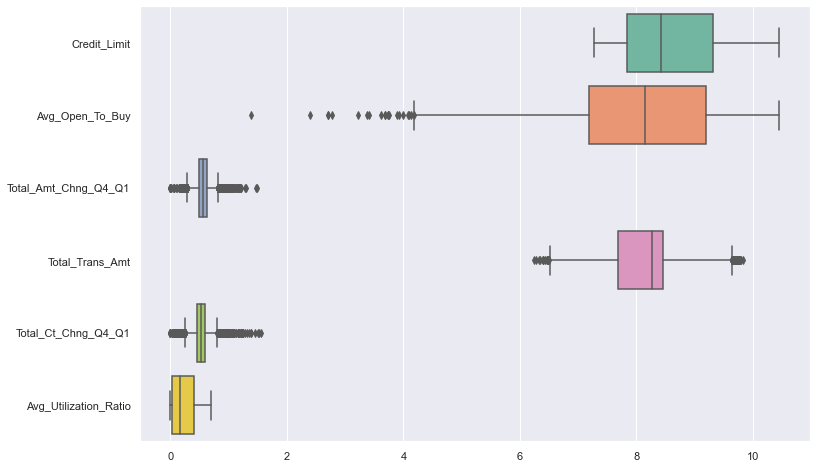

In [175]:
ax = sns.boxplot(data=dfoutliers2, orient="h", palette="Set2")

Based tree algorithms, specially Xgboost are very robust and can handle outliers. Also, re-scaling independent variables wont't help neither. Based tree algorthms are invariant to monotonic transformations of the independent variables. 

##### Encoding  Variables

In [180]:
dfoutliers_log.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [46]:
df = dfoutliers_log.copy()
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,9.45,777,9.39,0.85,7.04,42,0.97,0.06
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,9.02,864,8.91,0.93,7.16,33,1.55,0.10
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,8.14,0,8.14,1.28,7.54,20,1.20,0.00
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,8.11,2517,6.68,0.88,7.07,20,1.20,0.57
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,8.46,0,8.46,1.16,6.71,28,1.25,0.00


In [47]:
from sklearn import preprocessing
labelencoder = preprocessing.LabelEncoder()
#df['Attrition_Flag'] = labelencoder.fit_transform(df['Attrition_Flag'])
df['Gender'] = labelencoder.fit_transform(df['Gender'])
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,1,3,High School,Married,$60K - $80K,Blue,39,5,1,3,9.45,777,9.39,0.85,7.04,42,0.97,0.06
1,Existing Customer,49,0,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,9.02,864,8.91,0.93,7.16,33,1.55,0.10
2,Existing Customer,51,1,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,8.14,0,8.14,1.28,7.54,20,1.20,0.00
3,Existing Customer,40,0,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,8.11,2517,6.68,0.88,7.07,20,1.20,0.57
4,Existing Customer,40,1,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,8.46,0,8.46,1.16,6.71,28,1.25,0.00
5,Existing Customer,44,1,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,8.30,1247,7.92,0.87,6.99,24,0.61,0.27
6,Existing Customer,51,1,4,Unknown,Married,$120K +,Gold,46,6,1,3,10.45,2264,10.38,1.09,7.19,31,0.54,0.06
7,Existing Customer,32,1,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,10.28,1396,10.23,1.16,7.34,36,0.54,0.05
8,Existing Customer,37,1,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,10.01,2517,9.90,1.47,7.21,24,0.78,0.11
9,Existing Customer,48,1,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,9.36,1677,9.21,0.93,7.27,32,0.63,0.13


In [48]:
oneHotCols=["Card_Category","Marital_Status"]
df=pd.get_dummies(df, columns=oneHotCols)
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,...,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,Existing Customer,45,1,3,High School,$60K - $80K,39,5,1,3,...,0.97,0.06,1,0,0,0,0,1,0,0
1,Existing Customer,49,0,5,Graduate,Less than $40K,44,6,1,2,...,1.55,0.10,1,0,0,0,0,0,1,0
2,Existing Customer,51,1,3,Graduate,$80K - $120K,36,4,1,0,...,1.20,0.00,1,0,0,0,0,1,0,0
3,Existing Customer,40,0,4,High School,Less than $40K,34,3,4,1,...,1.20,0.57,1,0,0,0,0,0,0,1
4,Existing Customer,40,1,3,Uneducated,$60K - $80K,21,5,1,0,...,1.25,0.00,1,0,0,0,0,1,0,0
5,Existing Customer,44,1,2,Graduate,$40K - $60K,36,3,1,2,...,0.61,0.27,1,0,0,0,0,1,0,0
6,Existing Customer,51,1,4,Unknown,$120K +,46,6,1,3,...,0.54,0.06,0,1,0,0,0,1,0,0
7,Existing Customer,32,1,0,High School,$60K - $80K,27,2,2,2,...,0.54,0.05,0,0,0,1,0,0,0,1
8,Existing Customer,37,1,3,Uneducated,$60K - $80K,36,5,2,0,...,0.78,0.11,1,0,0,0,0,0,1,0
9,Existing Customer,48,1,2,Graduate,$80K - $120K,36,6,3,3,...,0.63,0.13,1,0,0,0,0,0,1,0


In [50]:
replaceStruct = {
                "Attrition_Flag": {"Existing Customer":0,"Attrited Customer":1},
                "Education_Level": {"Doctorate": 5,"Post-Graduate": 4,"Graduate": 3,"College": 2,"High School": 1,"Unknown": 0,"Uneducated": -1 },
                "Income_Category": {"$120K +": 4, "$80K - $120K": 3, "$60K - $80K": 2, "$40K - $60K": 1, "Unknown" :0, "Less than $40K": -1}
                    }

In [51]:
df=df.replace(replaceStruct)

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 26 columns):
Attrition_Flag              10127 non-null int64
Customer_Age                10127 non-null int64
Gender                      10127 non-null int32
Dependent_count             10127 non-null int64
Education_Level             10127 non-null int64
Income_Category             10127 non-null int64
Months_on_book              10127 non-null int64
Total_Relationship_Count    10127 non-null int64
Months_Inactive_12_mon      10127 non-null int64
Contacts_Count_12_mon       10127 non-null int64
Credit_Limit                10127 non-null float64
Total_Revolving_Bal         10127 non-null int64
Avg_Open_To_Buy             10127 non-null float64
Total_Amt_Chng_Q4_Q1        10127 non-null float64
Total_Trans_Amt             10127 non-null float64
Total_Trans_Ct              10127 non-null int64
Total_Ct_Chng_Q4_Q1         10127 non-null float64
Avg_Utilization_Ratio       10127 non-null float

##### Split Data into tran validation test set 

In [53]:
df2 = df.copy()

In [54]:
X = df2.drop("Attrition_Flag" , axis=1)
y = df2.pop("Attrition_Flag")

In [55]:
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state=1, stratify=y)

In [56]:
y_train.value_counts(normalize=True)*100

0   83.93
1   16.07
Name: Attrition_Flag, dtype: float64

In [57]:
y_test.value_counts(normalize=True)*100

0   83.94
1   16.06
Name: Attrition_Flag, dtype: float64

### Insights

* I've applied logarithm scaling to the folowing variables reducing skewwensto acceptable values: 
     
        Before: 
      
        Customer_Age               -0.03
        Dependent_count            -0.02
        Months_on_book             -0.11
        Total_Relationship_Count   -0.16
        Months_Inactive_12_mon      0.63
        Contacts_Count_12_mon       0.01
        Credit_Limit                1.67
        Total_Revolving_Bal        -0.15
        Avg_Open_To_Buy             1.66
        Total_Amt_Chng_Q4_Q1        1.73
        Total_Trans_Amt             2.04
        Total_Trans_Ct              0.15
        Total_Ct_Chng_Q4_Q1         2.06
        Avg_Utilization_Ratio       0.72
        
        After: 
        
        
        Customer_Age               -0.03
        Dependent_count            -0.02
        Months_on_book             -0.11
        Total_Relationship_Count   -0.16
        Months_Inactive_12_mon      0.63
        Contacts_Count_12_mon       0.01
        Credit_Limit                0.46
        Total_Revolving_Bal        -0.15
        Avg_Open_To_Buy            -0.10
        Total_Amt_Chng_Q4_Q1        0.65
        Total_Trans_Amt             0.26
        Total_Trans_Ct              0.15
        Total_Ct_Chng_Q4_Q1         0.51
        Avg_Utilization_Ratio       0.52

<a id='ML'></a>
### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Algorithm Development,Testing and Insights 

**Our Goal is predicting customer who is more likely to leave their credit card services. So, we need to focus on boosting the number of TP. The metric of interest here is recall.
I don't think that precission here would be a problem for the company but I'll try to get the best F1 also.**  

In [58]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [59]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    #Predicting on train and tests
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    #Accuracy of the model
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    #Recall of the model
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    #Precision of the model
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
    
    return score_list # returning the list with train and test scores

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;">  Logistic Regression

In [60]:
import imblearn
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

###### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> SMOTE to upsample smaller class

In [61]:
print("Before UpSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train==0)))

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())


print("After UpSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_train_res==0)))



print('After UpSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_res.shape))


Before UpSampling, counts of label '1': 1139
Before UpSampling, counts of label '0': 5949 

After UpSampling, counts of label '1': 5949
After UpSampling, counts of label '0': 5949 

After UpSampling, the shape of train_X: (11898, 25)
After UpSampling, the shape of train_y: (11898,) 



In [78]:
# Choose the type of classifier. 
logistic_estimator_tuned_Upsampling = linear_model.LogisticRegression(random_state=1,n_jobs=-1)
std_slc = StandardScaler()
pca = decomposition.PCA()
pipe = Pipeline(steps=[('std_slc', std_slc),
                        ('pca', pca),
                        ('logistic_Reg', logistic_estimator_tuned_Upsampling)])

n_components = list(range(1,X.shape[1]+1,1))
C = np.logspace(-4, 4, 50)
penalty = ['l1', 'l2']

# Grid of parameters to choose from
parameters = dict(pca__n_components=n_components,
                      logistic_Reg__C=C,
                      logistic_Reg__penalty=penalty)

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
n_iter_search = 1000
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
# Run the grid search
grid_obj = RandomizedSearchCV(pipe, n_iter=n_iter_search, param_distributions=parameters,verbose=2, scoring=acc_scorer,cv=5,n_jobs=4)
grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
logistic_estimator_tuned_Upsampling = grid_obj.best_estimator_

# Fit the best algorithm to the data.
logistic_estimator_tuned_Upsampling.fit(X_train_res, y_train_res)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


Pipeline(steps=[('std_slc', StandardScaler()), ('pca', PCA(n_components=25)),
                ('logistic_Reg',
                 LogisticRegression(C=1.2067926406393288, n_jobs=-1,
                                    random_state=1))])

In [70]:
#Using above defined function to get accuracy, recall and precision on train and test set
logistic_estimator_tuned_Upsampling_score=get_metrics_score(logistic_estimator_tuned_Upsampling)

Accuracy on training set :  0.9036399548532731
Accuracy on test set :  0.9045738729845344
Recall on training set :  0.7506584723441615
Recall on test set :  0.7622950819672131
Precision on training set :  0.6818181818181818
Precision on test set :  0.6813186813186813


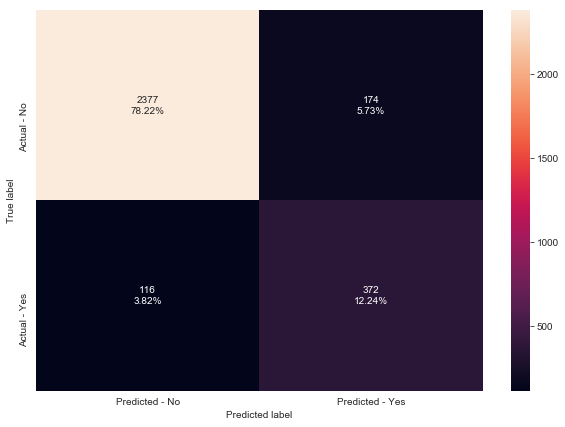

In [71]:
make_confusion_matrix(logistic_estimator_tuned_Upsampling,y_test)

###### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> SMOTE to downsample smaller class

In [73]:
print("Before DownSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before DownSampling, counts of label '0': {} \n".format(sum(y_train==0)))
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler()
X_train_res, y_train_res = rus.fit_resample(X_train, y_train)

print("After UpSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_train_res==0)))



print('After DownSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After DownSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

Before DownSampling, counts of label '1': 1139
Before DownSampling, counts of label '0': 5949 

After UpSampling, counts of label '1': 1139
After UpSampling, counts of label '0': 1139 

After DownSampling, the shape of train_X: (2278, 25)
After DownSampling, the shape of train_y: (2278,) 



In [81]:
# Choose the type of classifier. 
logistic_estimator_tuned_downsampling = linear_model.LogisticRegression(random_state=1,n_jobs=-1)
std_slc = StandardScaler()
pca = decomposition.PCA()
pipe = Pipeline(steps=[('std_slc', std_slc),
                        ('pca', pca),
                        ('logistic_Reg', logistic_estimator_tuned_downsampling)])

n_components = list(range(1,X.shape[1]+1,1))
C = np.logspace(-4, 4, 50)
penalty = ['l1', 'l2']

# Grid of parameters to choose from
parameters = dict(pca__n_components=n_components,
                      logistic_Reg__C=C,
                      logistic_Reg__penalty=penalty)

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
n_iter_search = 1500
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
# Run the grid search
grid_obj = RandomizedSearchCV(pipe, n_iter=n_iter_search, param_distributions=parameters,verbose=2, scoring=acc_scorer,cv=5,n_jobs=4)
grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
logistic_estimator_tuned_downsampling = grid_obj.best_estimator_

# Fit the best algorithm to the data.
logistic_estimator_tuned_downsampling.fit(X_train_res, y_train_res)

Fitting 5 folds for each of 1500 candidates, totalling 7500 fits


Pipeline(steps=[('std_slc', StandardScaler()), ('pca', PCA(n_components=23)),
                ('logistic_Reg',
                 LogisticRegression(C=1.2067926406393288, n_jobs=-1,
                                    random_state=1))])

In [82]:
#Using above defined function to get accuracy, recall and precision on train and test set
logistic_estimator_tuned_downsampling_score=get_metrics_score(logistic_estimator_tuned_downsampling)

Accuracy on training set :  0.8611738148984198
Accuracy on test set :  0.8496215860480422
Recall on training set :  0.8647936786654961
Recall on test set :  0.8852459016393442
Precision on training set :  0.5426997245179064
Precision on test set :  0.5186074429771909


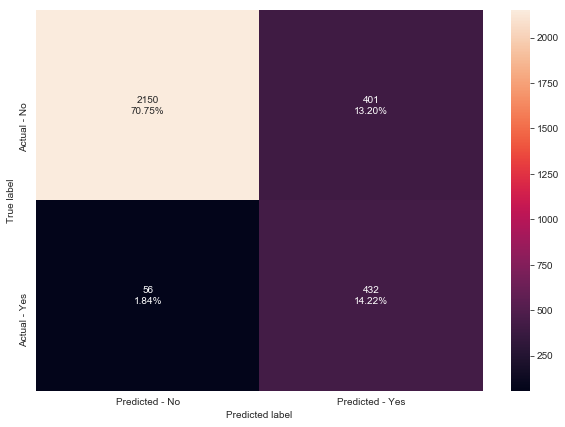

In [83]:
make_confusion_matrix(logistic_estimator_tuned_downsampling,y_test)

### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> Random Search + Pipeline

In [87]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from scipy.stats import randint as sp_randint

###### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> Bagging Classifier

Accuracy on training set :  0.9957674943566591
Accuracy on test set :  0.9647910496873972
Recall on training set :  0.9789288849868305
Recall on test set :  0.8627049180327869
Precision on training set :  0.9946476360392507
Precision on test set :  0.913232104121475


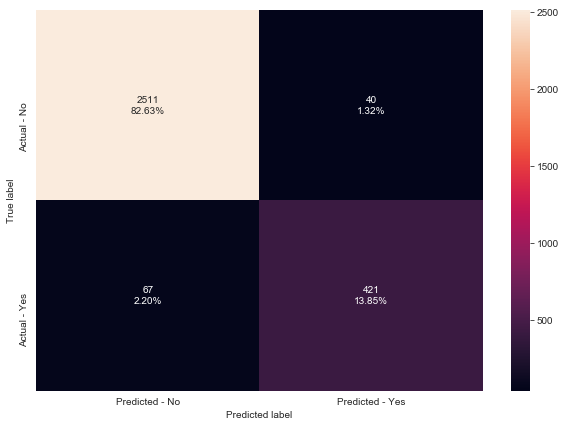

In [132]:
# Choose the type of classifier. 
bagging_estimator_tuned = BaggingClassifier(random_state=1,n_jobs=-1)

# Grid of parameters to choose from
parameters = {'max_samples': [0.1,0.6,0.9,1], 
              'max_features': [0.1,0.6,0.8,0.9,1],
              'n_estimators' : [10,20,40,50,100],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
n_iter_search = 500
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
# Run the grid search
grid_obj = RandomizedSearchCV(bagging_estimator_tuned, n_iter=n_iter_search, param_distributions=parameters,verbose=0, scoring=acc_scorer,cv=5,n_jobs=4)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned.fit(X_train, y_train)

#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_tuned_score=get_metrics_score(bagging_estimator_tuned)

make_confusion_matrix(bagging_estimator_tuned,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;">  Decision Trees

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
Accuracy on training set :  0.9173250564334086
Accuracy on test set :  0.910167818361303
Recall on training set :  0.7401229148375769
Recall on test set :  0.735655737704918
Precision on training set :  0.7440423654015887
Precision on test set :  0.7137176938369781


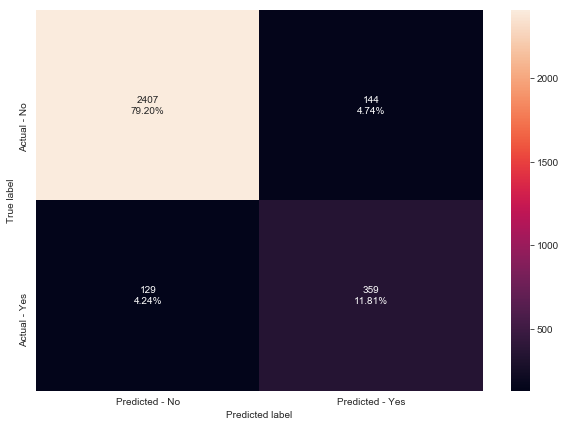

In [90]:
# Choose the type of classifier. 
estimator = DecisionTreeClassifier(random_state=1)


pipe_RF= Pipeline([('estimator',estimator)]) 


# Choose the type of classifier. 

# Grid of parameters to choose from
parameters = {
    #'pca__n_components': [0.95,0.85,0.90],
    "estimator__max_depth": sp_randint(1,10),
    "estimator__min_samples_leaf": sp_randint(1,20),
    "estimator__min_samples_leaf": sp_randint(5, 10),
    "estimator__max_leaf_nodes": sp_randint(1,10),
    "estimator__min_impurity_decrease": [0.001,0.01,0.1]
             }
n_iter_search = 500
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
# Run the grid search
grid_obj = RandomizedSearchCV(pipe_RF,n_iter=n_iter_search, param_distributions=parameters,verbose=2, scoring=acc_scorer,cv=5,n_jobs=8)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
decision_tree = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
decision_tree.fit(X_train, y_train)

estimator_score=get_metrics_score(decision_tree)

make_confusion_matrix(decision_tree,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;">  AdaBoost Classifier

Accuracy on training set :  0.9789785553047404
Accuracy on test set :  0.9684106614017769
Recall on training set :  0.9086918349429324
Recall on test set :  0.8627049180327869
Precision on training set :  0.9583333333333334
Precision on test set :  0.9355555555555556


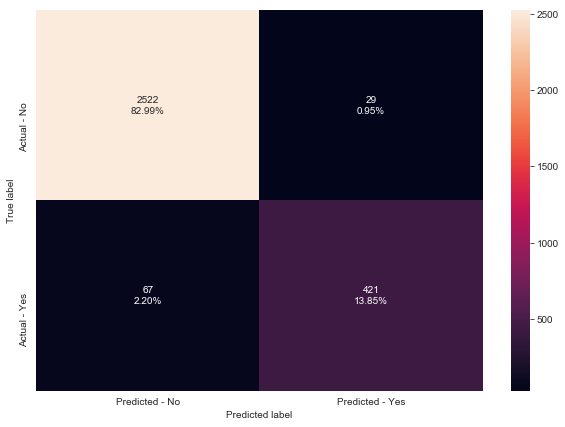

In [94]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
estimator = AdaBoostClassifier(random_state=1)



pipe_RF= Pipeline([('estimator',estimator)]) 


# Choose the type of classifier. 

# Grid of parameters to choose from
parameters = {
    #'pca__n_components': [0.95,0.85,0.90],
    "estimator__base_estimator":[DecisionTreeClassifier(max_depth=3, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=8, random_state=1),DecisionTreeClassifier(max_depth=5, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=10, random_state=1),DecisionTreeClassifier(max_depth=8, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=8, random_state=1)],
    "estimator__n_estimators": sp_randint(10,110),
    "estimator__learning_rate":np.arange(0.01, 0.10, 0.05),

             }
# Grid of parameters to choose from
## add from article

n_iter_search = 500
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = RandomizedSearchCV(pipe_RF, param_distributions=parameters, scoring=acc_scorer,cv=5,n_jobs=8)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned1 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned1.fit(X_train, y_train)

#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score1=get_metrics_score(abc_tuned1)

make_confusion_matrix(abc_tuned1,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;">  AdaBoost Classifier + downsample target

Accuracy on training set :  0.9497742663656885
Accuracy on test set :  0.9453767686739059
Recall on training set :  0.9192273924495171
Recall on test set :  0.9282786885245902
Precision on training set :  0.7986270022883295
Precision on test set :  0.7756849315068494


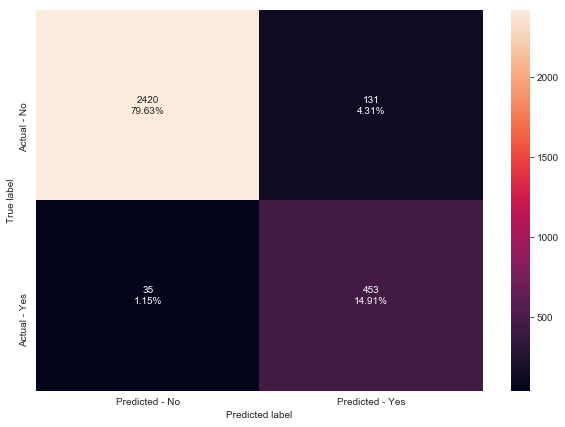

In [145]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
estimator = AdaBoostClassifier(random_state=1)



pipe_RF= Pipeline([('estimator',estimator)]) 


# Choose the type of classifier. 

# Grid of parameters to choose from
parameters = {
    #'pca__n_components': [0.95,0.85,0.90],
    "estimator__base_estimator":[DecisionTreeClassifier(max_depth=3, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=8, random_state=1),DecisionTreeClassifier(max_depth=5, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=10, random_state=1),DecisionTreeClassifier(max_depth=8, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=8, random_state=1)],
    "estimator__n_estimators": sp_randint(10,110),
    "estimator__learning_rate":np.arange(0.01, 0.10, 0.05),

             }
# Grid of parameters to choose from
## add from article

n_iter_search = 500
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = RandomizedSearchCV(pipe_RF, param_distributions=parameters, scoring=acc_scorer,cv=5,n_jobs=8)
grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train_res, y_train_res)

#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score=get_metrics_score(abc_tuned)

make_confusion_matrix(abc_tuned,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;"> XGboost v.1

In [96]:
import xgboost as xgb

In [98]:
param_grid = {

        'learning_rate': np.arange(0.01, 0.10, 0.1), 
        'min_child_weight': np.arange(1, 10, 2),
        'max_depth': np.arange(3, 12, 2),
        'max_delta_step': np.arange(5, 15, 2),
        'subsample': np.arange(0.01, 1, 0.3),
        'colsample_bytree': np.arange(0.01, 0.7, 0.3),
        'colsample_bylevel': np.arange(0.01, 1, 0.1),
        'reg_lambda': np.arange(1e-9, 10, 3),
        'reg_alpha': np.arange(1e-9, 2, 0.5),
        'gamma': np.arange(0.7, 2, 0.5),
        'scale_pos_weight': np.arange(3, 7, 1),
        }
  

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
  
xgb_tuned1 = xgb.XGBClassifier(base_score=0.5, booster = 'gbtree', n_estimators = 160 , nthread=-1, rate_drop = 0.1, verbosity = 1, objective='binary:logistic', random_state=42)
n_iter_search = 50

# Run the grid search
grid_obj = RandomizedSearchCV(xgb_tuned1, param_distributions=param_grid, n_iter=n_iter_search, scoring=acc_scorer,
                             cv=5,
                             verbose=1,
                             return_train_score=True,
                             n_jobs=-1, 
                             random_state=1)


grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_tuned1 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned1.fit(X_train, y_train)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


NameError: name 'xgb_tuned' is not defined

In [100]:
print(xgb_tuned1)

XGBClassifier(colsample_bylevel=0.41000000000000003, colsample_bytree=0.01,
              gamma=0.7, learning_rate=0.01, max_delta_step=9, max_depth=5,
              n_estimators=160, nthread=-1, random_state=42, rate_drop=0.1,
              reg_alpha=0.500000001, reg_lambda=1e-09, scale_pos_weight=6,
              subsample=0.9099999999999999)


Accuracy on training set :  0.7957110609480813
Accuracy on test set :  0.780519907864429
Recall on training set :  0.9736611062335382
Recall on test set :  0.9590163934426229
Precision on training set :  0.43886030866640285
Precision on test set :  0.41973094170403585


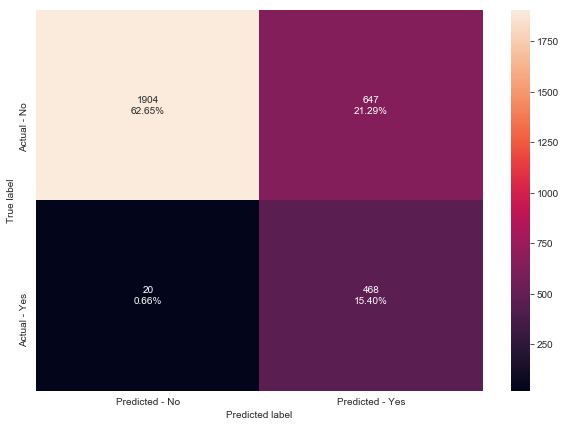

In [99]:
xgb_tuned_score=get_metrics_score(xgb_tuned1)

make_confusion_matrix(xgb_tuned1,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;"> XGboost v.2 Downsample class + PCA

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
Accuracy on training set :  0.1606941309255079
Accuracy on test set :  0.16057913787430075
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.1606941309255079
Precision on test set :  0.16057913787430075


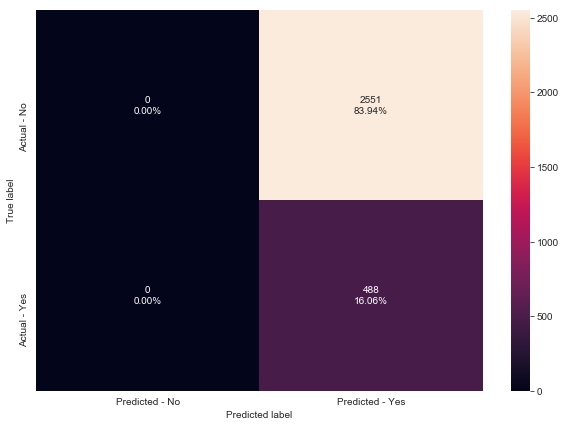

In [105]:
estimator =  xgb.XGBClassifier(base_score=0.5, booster = 'gbtree', nthread=-1, rate_drop = 0.1, verbosity = 1, objective='binary:logistic', random_state=42)



pipe_RF= Pipeline([('pca', pca),('estimator',estimator)]) 


# Choose the type of classifier. 
n_components = list(range(1,X.shape[1]+1,1))
# Grid of parameters to choose from



parameters = {
        'pca__n_components': n_components,
        'estimator__learning_rate': np.arange(0.01, 0.10, 0.1),
        'estimator__n_estimators' :  sp_randint(100, 300),
        'estimator__min_child_weight': sp_randint(1, 15),
        'estimator__max_depth': sp_randint(3, 12),
        'estimator__max_delta_step': sp_randint(5, 15),
        'estimator__subsample': np.arange(0.01, 1, 0.3),
        'estimator__colsample_bytree': np.arange(0.01, 0.7, 0.3),
        'estimator__colsample_bylevel': np.arange(0.01, 1, 0.1),
        'estimator__reg_lambda': np.arange(1e-9, 10, 3),
        'estimator__reg_alpha': np.arange(1e-9, 2, 0.5),
        'estimator__gamma': np.arange(0.7, 2, 0.5),
        'estimator__scale_pos_weight': sp_randint(1,5)
        }
  

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
  
n_iter_search = 500

# Run the grid search
grid_obj = RandomizedSearchCV(pipe_RF, param_distributions=parameters, n_iter=n_iter_search, scoring=acc_scorer,
                             cv=5,
                             verbose=1,
                             return_train_score=True,
                             n_jobs=-1, 
                             random_state=1)


grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
xgb_tuned2 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned2.fit(X_train_res, y_train_res)

xgb_tuned_score=get_metrics_score(xgb_tuned2)

make_confusion_matrix(xgb_tuned2,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;"> XGboost v.3 UPsample class + PCA

In [106]:
sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

Fitting 5 folds for each of 250 candidates, totalling 1250 fits
Accuracy on training set :  0.16252821670428894
Accuracy on test set :  0.16189536031589338
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.1609893992932862
Precision on test set :  0.16079077429983527


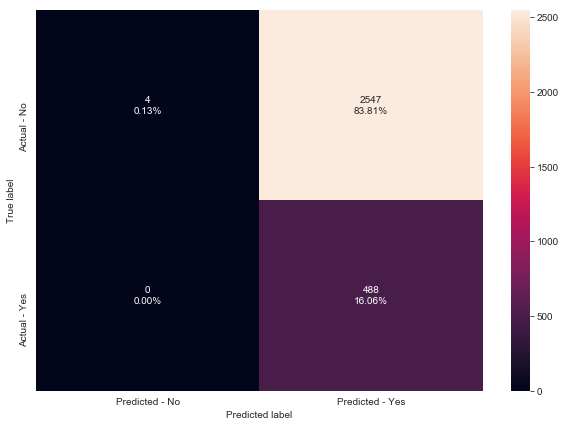

In [111]:
estimator =  xgb.XGBClassifier(base_score=0.5,n_estimators= 150,booster = 'gbtree', nthread=-1, rate_drop = 0.1, verbosity = 1, objective='binary:logistic', random_state=42)



pipe_RF= Pipeline([('pca', pca),('estimator',estimator)]) 


# Choose the type of classifier. 
n_components = list(range(1,X.shape[1]+1,1))
# Grid of parameters to choose from



parameters = {
        'pca__n_components': n_components,
        'estimator__learning_rate': np.arange(0.01, 0.10, 0.1),
        'estimator__min_child_weight': sp_randint(1, 15),
        'estimator__max_depth': sp_randint(3, 12),
        'estimator__max_delta_step': sp_randint(5, 15),
        'estimator__subsample': np.arange(0.01, 1, 0.3),
        'estimator__colsample_bytree': np.arange(0.01, 0.7, 0.3),
        'estimator__colsample_bylevel': np.arange(0.01, 1, 0.1),
        'estimator__reg_lambda': np.arange(1e-9, 10, 3),
        'estimator__reg_alpha': np.arange(1e-9, 2, 0.5),
        'estimator__gamma': np.arange(0.7, 2, 0.5),
        'estimator__scale_pos_weight': sp_randint(1,3),
        }
  

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
  
n_iter_search = 250

# Run the grid search
grid_obj = RandomizedSearchCV(pipe_RF, param_distributions=parameters, n_iter=n_iter_search, scoring=acc_scorer,
                             cv=5,
                             verbose=1,
                             return_train_score=True,
                             n_jobs=4, 
                             random_state=1)


grid_obj = grid_obj.fit(X_train_res, y_train_res)

# Set the clf to the best combination of parameters
xgb_tuned3 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned3.fit(X_train_res, y_train_res)

xgb_tuned_score=get_metrics_score(xgb_tuned3)

make_confusion_matrix(xgb_tuned3,y_test)

### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> Grid Search + Pipeline

###### <span style="font-family: Arial;font-size:1.10em;color:#6E6E6E;"> Bagging Classifier Improved

In [115]:
# Choose the type of classifier. 
bagging_estimator_tuned = BaggingClassifier(random_state=1,n_jobs=-1)

# Grid of parameters to choose from
parameters = {'max_samples': [0.1,0.6,1], 
              'max_features': [0.1,0.6,0.9,1],
              'n_estimators' : [10,50,100],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)
n_iter_search = 50
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)
# Run the grid search
grid_obj = GridSearchCV(bagging_estimator_tuned,param_grid=parameters,verbose=0, scoring=acc_scorer,cv=5,n_jobs=4)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_estimator_tuned_grid = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned_grid.fit(X_train, y_train)

BaggingClassifier(max_features=0.9, max_samples=0.6, n_estimators=100,
                  n_jobs=-1, random_state=1)

In [116]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_tuned_score=get_metrics_score(bagging_estimator_tuned_grid)

Accuracy on training set :  0.9957674943566591
Accuracy on test set :  0.9647910496873972
Recall on training set :  0.9789288849868305
Recall on test set :  0.8627049180327869
Precision on training set :  0.9946476360392507
Precision on test set :  0.913232104121475


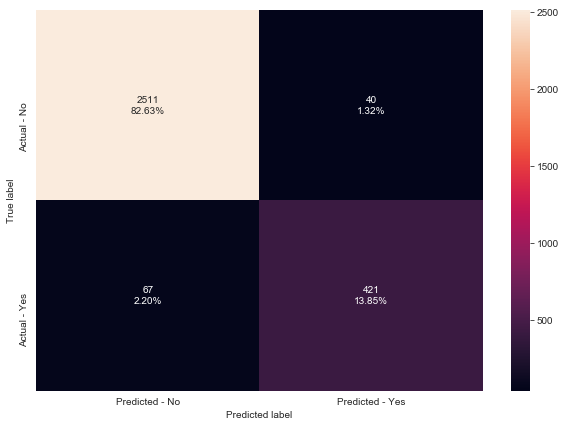

In [117]:
make_confusion_matrix(bagging_estimator_tuned_grid,y_test)

###### <span style="font-family: Arial;font-size:1.80em;color:#6E6E6E;">  AdaBoost Classifier

In [119]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "base_estimator":[DecisionTreeClassifier(max_depth=8, max_leaf_nodes=9,
                                        min_impurity_decrease=0.001,
                                        min_samples_leaf=8, random_state=1),xgb.XGBClassifier(colsample_bylevel=0.41000000000000003, colsample_bytree=0.01,
              gamma=0.7, learning_rate=0.01, max_delta_step=9, max_depth=5,
              n_estimators=160, nthread=-1, random_state=42, rate_drop=0.1,
              reg_alpha=0.500000001, reg_lambda=1e-09, scale_pos_weight=6,
              subsample=0.9099999999999999)],
    "n_estimators": np.arange(10,110,40),
    "learning_rate":np.arange(0.1,2,0.3)
}
n_iter_search = 500
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(abc_tuned, param_grid=parameters, scoring=acc_scorer,cv=5,n_jobs=4)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned_grid = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned_grid.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                         max_leaf_nodes=9,
                                                         min_impurity_decrease=0.001,
                                                         min_samples_leaf=8,
                                                         random_state=1),
                   learning_rate=1.0000000000000002, n_estimators=90,
                   random_state=1)

In [120]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score=get_metrics_score(abc_tuned_grid)

Accuracy on training set :  1.0
Accuracy on test set :  0.9720302731161566
Recall on training set :  1.0
Recall on test set :  0.9057377049180327
Precision on training set :  1.0
Precision on test set :  0.918918918918919


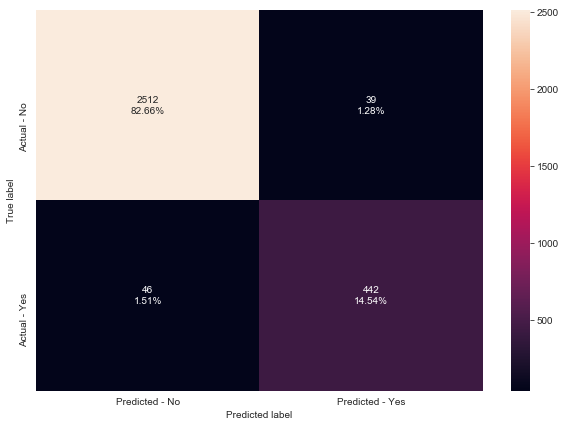

In [121]:
make_confusion_matrix(abc_tuned_grid,y_test)

<a id='Evaluation'></a>
### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Model performance evaluation

In [141]:
abc_tuned1

Pipeline(steps=[('estimator',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                                          max_leaf_nodes=9,
                                                                          min_impurity_decrease=0.001,
                                                                          min_samples_leaf=8,
                                                                          random_state=1),
                                    learning_rate=0.060000000000000005,
                                    n_estimators=98, random_state=1))])

In [146]:
# I am selecting only the best models from the previous section which were improved by hyperparameters optimization methods


models = [logistic_estimator_tuned_downsampling,logistic_estimator_tuned_Upsampling, bagging_estimator_tuned,decision_tree,
          abc_tuned1,abc_tuned, xgb_tuned1, xgb_tuned2,xgb_tuned3,bagging_estimator_tuned_grid,abc_tuned_grid]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))

In [147]:
comparison_frame = pd.DataFrame({'Model':['logistic_estimator_tuned_downsampling','logistic_estimator_tuned_Upsampling','Tuned Bagging Classifier','Tuned decision_tree Classifier','Aadabost tuned','Aadabost tuned downsampling','XGBoost Tuned','XGBoost Tuned2','XGBoost Tuned3','Bagging Grid','Aadaboost Grid'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
0,logistic_estimator_tuned_downsampling,0.86,0.85,0.86,0.89,0.54,0.52
1,logistic_estimator_tuned_Upsampling,0.86,0.85,0.86,0.89,0.54,0.52
2,Tuned Bagging Classifier,1.00,0.96,0.98,0.86,0.99,0.91
3,Tuned decision_tree Classifier,0.92,0.91,0.74,0.74,0.74,0.71
4,Aadabost tuned,0.98,0.97,0.91,0.86,0.96,0.94
5,Aadabost tuned downsampling,0.95,0.95,0.92,0.93,0.80,0.78
6,XGBoost Tuned,0.80,0.78,0.97,0.96,0.44,0.42
7,XGBoost Tuned2,0.16,0.16,1.00,1.00,0.16,0.16
8,XGBoost Tuned3,0.16,0.16,1.00,1.00,0.16,0.16
9,Bagging Grid,1.00,0.96,0.98,0.86,0.99,0.91


#### Insights

No question about the champs model - aadaboost using previous decisiontree and donwsampling method gave me % recall score in traind and test data - it is not overfitting. Also xgoost gives an amazing recall score but class weight is hight so it will produce so many false positives on production leaving the precision scores very low. The rest algortihms are overfitting. 
However with more time,compuattional power and train Data I can see a potencial algorithm that could solve the company problem statement. I'm going to stack my best algorithms to see if I can get better results and handle better the overfiiting issue. 

### <span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#B43104;">  Stacking

In [152]:
abc_tuned_grid

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                         max_leaf_nodes=9,
                                                         min_impurity_decrease=0.001,
                                                         min_samples_leaf=8,
                                                         random_state=1),
                   learning_rate=1.0000000000000002, n_estimators=90,
                   random_state=1)

In [153]:
from sklearn.ensemble import StackingClassifier

In [156]:
base_models = [('Aadabost tuned downsampling', Pipeline(steps=[('estimator',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                                          max_leaf_nodes=9,
                                                                          min_impurity_decrease=0.001,
                                                                          min_samples_leaf=8,
                                                                          random_state=1),
                                    learning_rate=0.060000000000000005,
                                    n_estimators=75, random_state=1))])),
               ('XGBoost Tuned', xgb.XGBClassifier(colsample_bylevel=0.41000000000000003, colsample_bytree=0.01,
              gamma=0.7, learning_rate=0.01, max_delta_step=9, max_depth=5,
              n_estimators=160, nthread=-1, random_state=42, rate_drop=0.1,
              reg_alpha=0.500000001, reg_lambda=1e-09, scale_pos_weight=6,
              subsample=0.9099999999999999)),
               ('Aadaboost Grid', AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=8,
                                                         max_leaf_nodes=9,
                                                         min_impurity_decrease=0.001,
                                                         min_samples_leaf=8,
                                                         random_state=1),
                   learning_rate=1.0000000000000002, n_estimators=90,
                   random_state=1))]
meta_model = BaggingClassifier(max_features=0.9, max_samples=0.6, n_estimators=100,
                  n_jobs=-1, random_state=1)
stacking_model = StackingClassifier(estimators=base_models, 
                                    final_estimator=meta_model, 
                                    passthrough=True, 
                                    cv=5,
                                    verbose=2)

In [157]:
# Fit the best algorithm to the data.
stacking_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   19.7s finished


StackingClassifier(cv=5,
                   estimators=[('Aadabost tuned downsampling',
                                Pipeline(steps=[('estimator',
                                                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                                                                          max_leaf_nodes=9,
                                                                                                          min_impurity_decrease=0.001,
                                                                                                          min_samples_leaf=8,
                                                                                                          random_state=1),
                                                                    learning_rate=0.060000000000000005,
                                                                    n_estimators=75,
                                  

In [158]:
stacking_model_score=get_metrics_score(stacking_model)

Accuracy on training set :  0.994920993227991
Accuracy on test set :  0.9717012175057584
Recall on training set :  0.9877085162423178
Recall on test set :  0.9139344262295082
Precision on training set :  0.980819529206626
Precision on test set :  0.9102040816326531


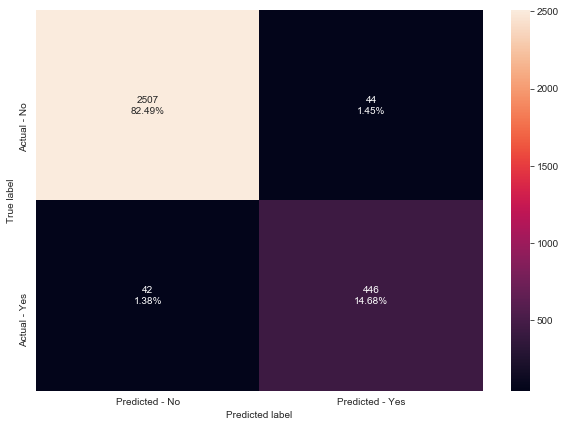

In [159]:
make_confusion_matrix(stacking_model,y_test)

#### Insights

Clearly overfited model but I've got an awesome recall result compared with the baselines. To reduce overfitting we should collect more data and study in depth regularization hyperparameters on algorithms and cross validation methods to avoid overfiitin while learning from training data. 

<a id='Insight'></a>
### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#B43104;">  Actionable Insights & Recommendations

+ We need to collect more information abour customer behaviour. Data from external sources could add predicitive value if internally we are not able to create process more information about our costumers. 

- The actual dataset is not enought to build a robust algorihtm. We would need more data to cretae validation and bigger test data that represent the population - so the future.  Overfitting is a porblem on paper, but we could overffit training data and still have good enought scores on production. Volatibility on results should be study but following the ML Ops principles could solve this issue (monitoring and retraining). 

+ My final model has an x porcent recall score which I think that it is an acceptable number to take in consideration and should be used by decision makers in the company. Managers could use the outcome of my algorithm to make better decison to which client contact first to avoid churn. Obviously it should be linked to a costumer value model and have these two scores combined to make a better decision. 

- The Company is in the right direction collecting this type of Data but they need more volume and more quality data points that could help the algorithms to understand the behaviour of the client. 